In [182]:
import os
import pandas as pd
import numpy as np
from glob import glob
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats.mstats import pearsonr
from flexitext import flexitext
import matplotlib.pyplot as plt





Run lmm regression:

Pos_arousal = w_score + NAcc_TR_x + (subject)



- Re-calculate z-score data with only samples used.
- Cut out any neural point that has a z-score>3.
- remove watch score bigger than 3.
- Check onset NAcc and AIns for typo.

# Homemade functions

In [183]:

def plot_correlations_bothTrailers(dataset_df, type, comedy_corr, horror_corr, title):
    
    # Define ROI labels. 
    NAcc_label = "NAcc_" + type
    AIns_label = "AIns_" + type
    MPFC_label = "MPFC_" + type

    whole_both_trailers_plot = sns.pairplot(
        dataset_df,
        kind="reg",
        x_vars=[NAcc_label, AIns_label, MPFC_label],
        y_vars=["Pos_arousal_scaled", "Neg_arousal_scaled"], 
        hue="Type",
        palette="viridis", 
        #scatter_kws = {"s":3} try to change the size of the dots
        height=5,
        aspect=1.2)
    
    whole_both_trailers_plot.fig.suptitle(title, y=1.03, fontsize=20, fontweight ="bold")
    plt.rc('legend', fontsize=25, title_fontsize=28, markerscale=2)

    # Add annotations to the first plot. 
    comedy_cor_string = "C r= " + str(round(comedy_corr[0][0], 4)) + "; p-value: " + str(round(comedy_corr[0][1], 5))
    horror_cor_string = "H r= " + str(round(horror_corr[0][0], 4)) + "; p-value: " + str(round(horror_corr[0][1], 5))
    whole_both_trailers_plot.axes[0, 0].text(s=horror_cor_string, x=.07, y=-2, fontsize=12)
    whole_both_trailers_plot.axes[0, 0].text(s=comedy_cor_string, x=.07, y=-2.3, fontsize=12)

    # Add annotations to the second plot.
    comedy_cor_string = "C r= " + str(round(comedy_corr[1][0], 4)) + "; p-value: " + str(round(comedy_corr[1][1], 5))
    horror_cor_string = "H r= " + str(round(horror_corr[1][0], 4)) + "; p-value: " + str(round(horror_corr[1][1], 5))
    whole_both_trailers_plot.axes[1, 0].text(s=horror_cor_string, x=.07, y=-2, fontsize=12)
    whole_both_trailers_plot.axes[1, 0].text(s=comedy_cor_string, x=.07, y=-2.3, fontsize=12)

    # Add annotations to the third plot.
    comedy_cor_string = "C r= " + str(round(comedy_corr[3][0], 4)) + "; p-value: " + str(round(comedy_corr[3][1], 5))
    horror_cor_string = "H r= " + str(round(horror_corr[3][0], 4)) + "; p-value: " + str(round(horror_corr[3][1], 5))
    whole_both_trailers_plot.axes[0, 1].text(s=horror_cor_string, x=.03, y=-2, fontsize=12)
    whole_both_trailers_plot.axes[0, 1].text(s=comedy_cor_string, x=.03, y=-2.3, fontsize=12)

    # Add annotations to the fourth plot.
    comedy_cor_string = "C r= " + str(round(comedy_corr[4][0], 4)) + "; p-value: " + str(round(comedy_corr[4][1], 5))
    horror_cor_string = "H r= " + str(round(horror_corr[4][0], 4)) + "; p-value: " + str(round(horror_corr[4][1], 5))
    whole_both_trailers_plot.axes[1, 1].text(s=horror_cor_string, x=.03, y=-2, fontsize=12)
    whole_both_trailers_plot.axes[1, 1].text(s=comedy_cor_string, x=.03, y=-2.3, fontsize=12)

    # Add annotations to the fifth plot.
    comedy_cor_string = "C r= " + str(round(comedy_corr[6][0], 4)) + "; p-value: " + str(round(comedy_corr[6][1], 5))
    horror_cor_string = "H r= " + str(round(horror_corr[6][0], 4)) + "; p-value: " + str(round(horror_corr[6][1], 5))
    whole_both_trailers_plot.axes[0, 2].text(s=horror_cor_string, x=.03, y=-2, fontsize=12)
    whole_both_trailers_plot.axes[0, 2].text(s=comedy_cor_string, x=.03, y=-2.3, fontsize=12)

    # Add annotations to the sixth plot.
    comedy_cor_string = "C r= " + str(round(comedy_corr[7][0], 4)) + "; p-value: " + str(round(comedy_corr[7][1], 5))
    horror_cor_string = "H r= " + str(round(horror_corr[7][0], 4)) + "; p-value: " + str(round(horror_corr[7][1], 5))
    whole_both_trailers_plot.axes[1, 2].text(s=horror_cor_string, x=.03, y=-2, fontsize=12)
    whole_both_trailers_plot.axes[1, 2].text(s=comedy_cor_string, x=.03, y=-2.3, fontsize=12)



In [184]:

def plot_correlations3_bothTrailers(dataset_df, type, comedy_corr, horror_corr, title):
    
    # Define ROI labels. 
    NAcc_label = "NAcc_" + type
    AIns_label = "AIns_" + type
    MPFC_label = "MPFC_" + type

    whole_both_trailers_plot = sns.pairplot(
        dataset_df,
        kind="reg",
        x_vars=[NAcc_label, AIns_label, MPFC_label],
        y_vars=["Pos_arousal_scaled", "Neg_arousal_scaled", "W_score_scaled"], 
        hue="Type",
        palette="viridis", 
        #scatter_kws = {"s":3} try to change the size of the dots
        height=5,
        aspect=1.2)
    
    whole_both_trailers_plot.fig.suptitle(title, y=1.03, fontsize=20, fontweight ="bold")
    plt.rc('legend', fontsize=25, title_fontsize=28, markerscale=2)

    # Add annotations to the first plot (NAcc-Pos_arousal_scaled). 
    comedy_cor_string = "C r= " + str(round(comedy_corr[0][0], 4)) + "; p-value: " + str(round(comedy_corr[0][1], 5))
    horror_cor_string = "H r= " + str(round(horror_corr[0][0], 4)) + "; p-value: " + str(round(horror_corr[0][1], 5))
    whole_both_trailers_plot.axes[0, 0].text(s=horror_cor_string, x=.07, y=-.85, fontsize=12)
    whole_both_trailers_plot.axes[0, 0].text(s=comedy_cor_string, x=.07, y=-.95, fontsize=12)

    # Add annotations to the second plot (NAcc-Neg_arousal_scaled).
    comedy_cor_string = "C r= " + str(round(comedy_corr[1][0], 4)) + "; p-value: " + str(round(comedy_corr[1][1], 5))
    horror_cor_string = "H r= " + str(round(horror_corr[1][0], 4)) + "; p-value: " + str(round(horror_corr[1][1], 5))
    whole_both_trailers_plot.axes[1, 0].text(s=horror_cor_string, x=.07, y=-.95, fontsize=12)
    whole_both_trailers_plot.axes[1, 0].text(s=comedy_cor_string, x=.07, y=-1.05, fontsize=12)

    # Add annotations to the third plot (NAcc-W_score_scaled).
    comedy_cor_string = "C r= " + str(round(comedy_corr[2][0], 4)) + "; p-value: " + str(round(comedy_corr[2][1], 5))
    horror_cor_string = "H r= " + str(round(horror_corr[2][0], 4)) + "; p-value: " + str(round(horror_corr[2][1], 5))
    whole_both_trailers_plot.axes[2, 0].text(s=horror_cor_string, x=.07, y=-2.1, fontsize=12)
    whole_both_trailers_plot.axes[2, 0].text(s=comedy_cor_string, x=.07, y=-2.3, fontsize=12)

    # Add annotations to the fourth plot (AIns-Pos_arousal_scaled).
    comedy_cor_string = "C r= " + str(round(comedy_corr[3][0], 4)) + "; p-value: " + str(round(comedy_corr[3][1], 5))
    horror_cor_string = "H r= " + str(round(horror_corr[3][0], 4)) + "; p-value: " + str(round(horror_corr[3][1], 5))
    whole_both_trailers_plot.axes[0, 1].text(s=horror_cor_string, x=.03, y=-.85, fontsize=12)
    whole_both_trailers_plot.axes[0, 1].text(s=comedy_cor_string, x=.03, y=-.95, fontsize=12)

    # Add annotations to the fifth plot (AIns-Neg_arousal_scaled).
    comedy_cor_string = "C r= " + str(round(comedy_corr[4][0], 4)) + "; p-value: " + str(round(comedy_corr[4][1], 5))
    horror_cor_string = "H r= " + str(round(horror_corr[4][0], 4)) + "; p-value: " + str(round(horror_corr[4][1], 5))
    whole_both_trailers_plot.axes[1, 1].text(s=horror_cor_string, x=.03, y=-.95, fontsize=12)
    whole_both_trailers_plot.axes[1, 1].text(s=comedy_cor_string, x=.03, y=-1.05, fontsize=12)

    # Add annotations to the sixth plot (AIns-W_score_scaled).
    comedy_cor_string = "C r= " + str(round(comedy_corr[5][0], 4)) + "; p-value: " + str(round(comedy_corr[5][1], 5))
    horror_cor_string = "H r= " + str(round(horror_corr[5][0], 4)) + "; p-value: " + str(round(horror_corr[5][1], 5))
    whole_both_trailers_plot.axes[2, 1].text(s=horror_cor_string, x=.03, y=-2.1, fontsize=12)
    whole_both_trailers_plot.axes[2, 1].text(s=comedy_cor_string, x=.03, y=-2.3, fontsize=12)

    # Add annotations to the seventh plot (MPFC-Pos_arousal_scaled).
    comedy_cor_string = "C r= " + str(round(comedy_corr[6][0], 4)) + "; p-value: " + str(round(comedy_corr[6][1], 5))
    horror_cor_string = "H r= " + str(round(horror_corr[6][0], 4)) + "; p-value: " + str(round(horror_corr[6][1], 5))
    whole_both_trailers_plot.axes[0, 2].text(s=horror_cor_string, x=.03, y=-.85, fontsize=12)
    whole_both_trailers_plot.axes[0, 2].text(s=comedy_cor_string, x=.03, y=-.95, fontsize=12)

    # Add annotations to the eighth plot (MPFC-Neg_arousal_scaled).
    comedy_cor_string = "C r= " + str(round(comedy_corr[7][0], 4)) + "; p-value: " + str(round(comedy_corr[7][1], 5))
    horror_cor_string = "H r= " + str(round(horror_corr[7][0], 4)) + "; p-value: " + str(round(horror_corr[7][1], 5))
    whole_both_trailers_plot.axes[1, 2].text(s=horror_cor_string, x=.03, y=-.95, fontsize=12)
    whole_both_trailers_plot.axes[1, 2].text(s=comedy_cor_string, x=.03, y=-1.05, fontsize=12)

    # Add annotations to the ninth plot (MPFC-W_score_scaled).
    comedy_cor_string = "C r= " + str(round(comedy_corr[8][0], 4)) + "; p-value: " + str(round(comedy_corr[8][1], 5))
    horror_cor_string = "H r= " + str(round(horror_corr[8][0], 4)) + "; p-value: " + str(round(horror_corr[8][1], 5))
    whole_both_trailers_plot.axes[2, 2].text(s=horror_cor_string, x=.03, y=-2.1, fontsize=12)
    whole_both_trailers_plot.axes[2, 2].text(s=comedy_cor_string, x=.03, y=-2.3, fontsize=12)




In [185]:
# Fuction to create scatter plots with corr.
def plot_correlations(data_df, correlations_list, type_of_signal, title_fig):

    fig, ax = plt.subplots(3, 3, figsize=(30, 30))

    NAcc_label = "NAcc_" + type_of_signal 
    AIns_label = "AIns_" + type_of_signal
    MPFC_label = "MPFC_" + type_of_signal

    # NAcc and positive arousal
    Nacc_pa_plot = sns.regplot(data=data_df, x=NAcc_label, y="Pos_arousal_scaled", ax=ax[0, 0])
    title1 = "<size:15>Corr <color:blue>" + NAcc_label + "</> and Positive arousal</>" 
    flexitext(0.2, 1.035, title1, va="top", ax=ax[0, 0])
    r_value1 = "<weight:bold, size:15>r=" + str(round(correlations_list[0][0], 5)) + "; p-value: "+ str(round(correlations_list[0][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value1, ha="center", ax=ax[0, 0])

    # NAcc and negative arousal
    NAcc_na_plot = sns.regplot(data=data_df, x=NAcc_label, y="Neg_arousal_scaled", ax=ax[1, 0])
    title2 = "<size:15>Corr <color:blue>" + NAcc_label + "</> and Negative arousal</>"
    flexitext(0.2, 1.035, title2, va="top", ax=ax[1, 0])
    r_value2 = "<weight:bold, size:15>r=" + str(round(correlations_list[1][0], 5)) + "; p-value: "+ str(round(correlations_list[1][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value2, ha="center", ax=ax[1, 0])

    # NAcc and watch score
    NAcc_wa_plot = sns.regplot(data=data_df, x=NAcc_label, y="W_score_scaled", ax=ax[2, 0])
    title3 = "<size:15>Corr <color:blue>" + NAcc_label + "</> and Watch score</>"
    flexitext(0.2, 1.035, title3, va="top", ax=ax[2, 0])
    r_value3 = "<weight:bold, size:15>r=" + str(round(correlations_list[2][0], 5)) + "; p-value: "+ str(round(correlations_list[2][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value3, ha="center", ax=ax[2, 0])

    # AIns and positive arousal
    AIns_pa_plot = sns.regplot(data=data_df, x=AIns_label, y="Pos_arousal_scaled", ax=ax[0, 1], color="red")
    title4 = "<size:15>Corr <color:red>AIns</> and Positive arousal</>"
    flexitext(0.2, 1.035, title4, va="top", ax=ax[0, 1])
    r_value4 = "<weight:bold, size:15>r=" + str(round(correlations_list[3][0], 5)) + "; p-value: "+str(round(correlations_list[3][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value4, ha="center", ax=ax[0, 1])

    # AIns and negative arousal
    AIns_na_plot = sns.regplot(data=data_df, x=AIns_label, y="Neg_arousal_scaled", ax=ax[1, 1], color="red")
    title5 = "<size:15>Corr <color:red>AIns</> and Negative arousal</>"
    flexitext(0.2, 1.035, title5, va="top", ax=ax[1, 1])
    r_value5 = "<weight:bold, size:15>r=" + str(round(correlations_list[4][0], 5)) + "; p-value: "+str(round(correlations_list[4][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value5, ha="center", ax=ax[1, 1])

    # AIns and watch score
    AIns_wa_plot = sns.regplot(data=data_df, x=AIns_label, y="W_score_scaled", ax=ax[2, 1], color="red")
    title6 = "<size:15>Corr <color:red>AIns</> and Watch score</>"
    flexitext(0.2, 1.035, title6, va="top", ax=ax[2, 1])
    r_value6 = "<weight:bold, size:15>r=" + str(round(correlations_list[5][0], 5)) + "; p-value: "+str(round(correlations_list[5][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value6, ha="center", ax=ax[2, 1])

    # MPFC and positive arousal
    MPFC_pa_plot = sns.regplot(data=data_df, x=MPFC_label, y="Pos_arousal_scaled", ax=ax[0, 2], color="green")
    title7 = "<size:15>Corr <color:green>MPFC</> and Positive arousal</>"
    flexitext(0.2, 1.035, title7, va="top", ax=ax[0, 2])
    r_value7 = "<weight:bold, size:15>r=" + str(round(correlations_list[6][0], 5)) + "; p-value: "+str(round(correlations_list[6][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value7, ha="center", ax=ax[0, 2])

    # MPFC and negative arousal
    MPFC_na_plot = sns.regplot(data=data_df, x=MPFC_label, y="Neg_arousal_scaled", ax=ax[1, 2], color="green")
    title8 = "<size:15>Corr <color:green>MPFC</> and Negative arousal</>"
    flexitext(0.2, 1.035, title8, va="top", ax=ax[1, 2])   
    r_value8 = "<weight:bold, size:15>r=" + str(round(correlations_list[7][0], 5)) + "; p-value: "+str(round(correlations_list[7][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value8, ha="center", ax=ax[1, 2])
    
    # MPFC and watch score
    MPFC_wa_plot = sns.regplot(data=data_df, x=MPFC_label, y="W_score_scaled", ax=ax[2, 2], color="green")
    title9 = "<size:15>Corr <color:green>MPFC</> and Watch score</>"
    flexitext(0.2, 1.035, title9, va="top", ax=ax[2, 2])
    r_value9 = "<weight:bold, size:15>r=" + str(round(correlations_list[8][0], 5)) + "; p-value: "+str(round(correlations_list[8][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value9, ha="center", ax=ax[2, 2])

    # Set the title of the figure
    #fig.suptitle(title_fig, fontsize=20, fontweight ="bold")
    fig_title = "<weight:bold, size:20>" + title_fig + "</>"
    flexitext(0.5, 1.1, fig_title, ha="center", va="top", ax=ax[0, 1])

    plt.show()

In [186]:
# Fuction to create scatter plots with corr.
def plot_correlations_2trailers(data_df, correlations_list, type_of_signal, title_fig):

    fig, ax = plt.subplots(3, 3, figsize=(30, 30))

    NAcc_label = "NAcc_" + type_of_signal 
    AIns_label = "AIns_" + type_of_signal
    MPFC_label = "MPFC_" + type_of_signal

    # NAcc and positive arousal
    Nacc_pa_plot = sns.relplot(data=data_df, x=NAcc_label, y="Pos_arousal_scaled", hue="Type", ax=ax[0, 0])
    title1 = "<size:15>Corr <color:blue>" + NAcc_label + "</> and Positive arousal</>" 
    flexitext(0.2, 1.035, title1, va="top", ax=ax[0, 0])
    r_value1 = "<weight:bold, size:15>r=" + str(round(correlations_list[0][0], 5)) + "; p-value: "+ str(round(correlations_list[0][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value1, ha="center", ax=ax[0, 0])

    # NAcc and negative arousal
    NAcc_na_plot = sns.regplot(data=data_df, x=NAcc_label, y="Neg_arousal_scaled", ax=ax[1, 0])
    title2 = "<size:15>Corr <color:blue>" + NAcc_label + "</> and Negative arousal</>"
    flexitext(0.2, 1.035, title2, va="top", ax=ax[1, 0])
    r_value2 = "<weight:bold, size:15>r=" + str(round(correlations_list[1][0], 5)) + "; p-value: "+ str(round(correlations_list[1][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value2, ha="center", ax=ax[1, 0])

    # NAcc and watch score
    NAcc_wa_plot = sns.regplot(data=data_df, x=NAcc_label, y="W_score_scaled", ax=ax[2, 0])
    title3 = "<size:15>Corr <color:blue>" + NAcc_label + "</> and Watch score</>"
    flexitext(0.2, 1.035, title3, va="top", ax=ax[2, 0])
    r_value3 = "<weight:bold, size:15>r=" + str(round(correlations_list[2][0], 5)) + "; p-value: "+ str(round(correlations_list[2][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value3, ha="center", ax=ax[2, 0])

    # AIns and positive arousal
    AIns_pa_plot = sns.regplot(data=data_df, x=AIns_label, y="Pos_arousal_scaled", ax=ax[0, 1], color="red")
    title4 = "<size:15>Corr <color:red>AIns</> and Positive arousal</>"
    flexitext(0.2, 1.035, title4, va="top", ax=ax[0, 1])
    r_value4 = "<weight:bold, size:15>r=" + str(round(correlations_list[3][0], 5)) + "; p-value: "+str(round(correlations_list[3][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value4, ha="center", ax=ax[0, 1])

    # AIns and negative arousal
    AIns_na_plot = sns.regplot(data=data_df, x=AIns_label, y="Neg_arousal_scaled", ax=ax[1, 1], color="red")
    title5 = "<size:15>Corr <color:red>AIns</> and Negative arousal</>"
    flexitext(0.2, 1.035, title5, va="top", ax=ax[1, 1])
    r_value5 = "<weight:bold, size:15>r=" + str(round(correlations_list[4][0], 5)) + "; p-value: "+str(round(correlations_list[4][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value5, ha="center", ax=ax[1, 1])

    # AIns and watch score
    AIns_wa_plot = sns.regplot(data=data_df, x=AIns_label, y="W_score_scaled", ax=ax[2, 1], color="red")
    title6 = "<size:15>Corr <color:red>AIns</> and Watch score</>"
    flexitext(0.2, 1.035, title6, va="top", ax=ax[2, 1])
    r_value6 = "<weight:bold, size:15>r=" + str(round(correlations_list[5][0], 5)) + "; p-value: "+str(round(correlations_list[5][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value6, ha="center", ax=ax[2, 1])

    # MPFC and positive arousal
    MPFC_pa_plot = sns.regplot(data=data_df, x=MPFC_label, y="Pos_arousal_scaled", ax=ax[0, 2], color="green")
    title7 = "<size:15>Corr <color:green>MPFC</> and Positive arousal</>"
    flexitext(0.2, 1.035, title7, va="top", ax=ax[0, 2])
    r_value7 = "<weight:bold, size:15>r=" + str(round(correlations_list[6][0], 5)) + "; p-value: "+str(round(correlations_list[6][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value7, ha="center", ax=ax[0, 2])

    # MPFC and negative arousal
    MPFC_na_plot = sns.regplot(data=data_df, x=MPFC_label, y="Neg_arousal_scaled", ax=ax[1, 2], color="green")
    title8 = "<size:15>Corr <color:green>MPFC</> and Negative arousal</>"
    flexitext(0.2, 1.035, title8, va="top", ax=ax[1, 2])   
    r_value8 = "<weight:bold, size:15>r=" + str(round(correlations_list[7][0], 5)) + "; p-value: "+str(round(correlations_list[7][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value8, ha="center", ax=ax[1, 2])
    
    # MPFC and watch score
    MPFC_wa_plot = sns.regplot(data=data_df, x=MPFC_label, y="W_score_scaled", ax=ax[2, 2], color="green", logistic=True)
    title9 = "<size:15>Corr <color:green>MPFC</> and Watch score</>"
    flexitext(0.2, 1.035, title9, va="top", ax=ax[2, 2])
    r_value9 = "<weight:bold, size:15>r=" + str(round(correlations_list[8][0], 5)) + "; p-value: "+str(round(correlations_list[8][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value9, ha="center", ax=ax[2, 2])

    # Set the title of the figure
    #fig.suptitle(title_fig, fontsize=20, fontweight ="bold")
    fig_title = "<weight:bold, size:20>" + title_fig + "</>"
    flexitext(0.5, 1.1, fig_title, ha="center", va="top", ax=ax[0, 1])

    plt.show()

In [187]:
def compute_and_plot_corrs(dataframe, signal, title):

    NAcc_key = "NAcc_" + signal
    AIns_key = "AIns_" + signal
    MPFC_key = "MPFC_" + signal

    PA_key = "Pos_arousal_scaled" 
    NA_key = "Neg_arousal_scaled" 
    W_key = "W_score_scaled" 

    #Compute PA correlations
    NAcc_PA_corr = pearsonr(dataframe[NAcc_key], dataframe[PA_key])
    AIns_PA_corr = pearsonr(dataframe[AIns_key], dataframe[PA_key])
    MPFC_PA_corr = pearsonr(dataframe[MPFC_key], dataframe[PA_key])

    #Compute NA correlations
    NAcc_NA_corr = pearsonr(dataframe[NAcc_key], dataframe[NA_key])
    AIns_NA_corr = pearsonr(dataframe[AIns_key], dataframe[NA_key])
    MPFC_NA_corr = pearsonr(dataframe[MPFC_key], dataframe[NA_key])

    #Compute W correlations
    NAcc_W_corr = pearsonr(dataframe[NAcc_key], dataframe[W_key])
    AIns_W_corr = pearsonr(dataframe[AIns_key], dataframe[W_key])
    MPFC_W_corr = pearsonr(dataframe[MPFC_key], dataframe[W_key])

    #Create a list with all the correlations
    corrs = [NAcc_PA_corr, NAcc_NA_corr, NAcc_W_corr, AIns_PA_corr, AIns_NA_corr, AIns_W_corr, MPFC_PA_corr, MPFC_NA_corr, MPFC_W_corr]

    # Print the correlations results.
    print("The correlation between " + str(NAcc_key) + " activation and positive arousal is: " + str(round(NAcc_PA_corr[0], 5)) + " with a p-value of: " + str((NAcc_PA_corr[1])))
    print("The correlation between " + str(AIns_key) + " activation and positive arousal is: " + str(round(AIns_PA_corr[0], 5)) + " with a p-value of: " + str((AIns_PA_corr[1])))
    print("The correlation between " + str(MPFC_key) + " activation and positive arousal is: " + str(round(MPFC_PA_corr[0], 5)) + " with a p-value of: " + str((MPFC_PA_corr[1])))

    print("\nThe correlation between " + str(NAcc_key) + " activation and negative arousal is: " + str(round(NAcc_NA_corr[0], 5)) + " with a p-value of: " + str((NAcc_NA_corr[1])))
    print("The correlation between " + str(AIns_key) + " activation and negative arousal is: " + str(round(AIns_NA_corr[0], 5)) + " with a p-value of: " + str((AIns_NA_corr[1])))
    print("The correlation between " + str(MPFC_key) + " activation and negative arousal is: " + str(round(MPFC_NA_corr[0], 5)) + " with a p-value of: " + str((MPFC_NA_corr[1])))

    print("\nThe correlation between " + str(NAcc_key) + " activation and watch scores is: " + str(round(NAcc_W_corr[0], 5)) + " with a p-value of: " + str((NAcc_W_corr[1])))
    print("The correlation between " + str(AIns_key) + " activation and watch scores is: " + str(round(AIns_W_corr[0], 5)) + " with a p-value of: " + str((AIns_W_corr[1])))
    print("The correlation between " + str(MPFC_key) + " activation and watch scores is: " + str(round(MPFC_W_corr[0], 5)) + " with a p-value of: " + str((MPFC_W_corr[1])))

    plot_correlations(dataframe, corrs, signal, title)

In [188]:
def compute_and_plot_both_corrs(dataframe_main, dataframe_C, dataframe_H, signal, title):

    NAcc_key = "NAcc_" + signal
    AIns_key = "AIns_" + signal
    MPFC_key = "MPFC_" + signal

    PA_key = "Pos_arousal_scaled" 
    NA_key = "Neg_arousal_scaled" 
    W_key = "W_score_scaled" 

    # Compute PA correlations for Comedy trailers.
    NAcc_PA_comedy_corr = pearsonr(dataframe_C[NAcc_key], dataframe_C[PA_key])
    AIns_PA_comedy_corr = pearsonr(dataframe_C[AIns_key], dataframe_C[PA_key])
    MPFC_PA_comedy_corr = pearsonr(dataframe_C[MPFC_key], dataframe_C[PA_key])

    # Compute PA correlations for Horror trailers.
    NAcc_PA_horror_corr = pearsonr(dataframe_H[NAcc_key], dataframe_H[PA_key])
    AIns_PA_horror_corr = pearsonr(dataframe_H[AIns_key], dataframe_H[PA_key])
    MPFC_PA_horror_corr = pearsonr(dataframe_H[MPFC_key], dataframe_H[PA_key])

    # Compute NA correlations for Comedy trailers.
    NAcc_NA_comedy_corr = pearsonr(dataframe_C[NAcc_key], dataframe_C[NA_key])
    AIns_NA_comedy_corr = pearsonr(dataframe_C[AIns_key], dataframe_C[NA_key])
    MPFC_NA_comedy_corr = pearsonr(dataframe_C[MPFC_key], dataframe_C[NA_key])

    # Compute NA correlations for Horror trailers.
    NAcc_NA_horror_corr = pearsonr(dataframe_H[NAcc_key], dataframe_H[NA_key])
    AIns_NA_horror_corr = pearsonr(dataframe_H[AIns_key], dataframe_H[NA_key])
    MPFC_NA_horror_corr = pearsonr(dataframe_H[MPFC_key], dataframe_H[NA_key])

    # Compute W correlations for Comedy trailers.
    NAcc_W_comedy_corr = pearsonr(dataframe_C[NAcc_key], dataframe_C[W_key])
    AIns_W_comedy_corr = pearsonr(dataframe_C[AIns_key], dataframe_C[W_key])
    MPFC_W_comedy_corr = pearsonr(dataframe_C[MPFC_key], dataframe_C[W_key])

    # Compute W correlations for Horror trailers.
    NAcc_W_horror_corr = pearsonr(dataframe_H[NAcc_key], dataframe_H[W_key])
    AIns_W_horror_corr = pearsonr(dataframe_H[AIns_key], dataframe_H[W_key])
    MPFC_W_horror_corr = pearsonr(dataframe_H[MPFC_key], dataframe_H[W_key])

    # Create a list with all the correlations for Comedy trailers.
    corrs_comedy = [NAcc_PA_comedy_corr, NAcc_NA_comedy_corr, NAcc_W_comedy_corr, AIns_PA_comedy_corr, AIns_NA_comedy_corr, AIns_W_comedy_corr, MPFC_PA_comedy_corr, MPFC_NA_comedy_corr, MPFC_W_comedy_corr]

    # Create a list with all the correlations for Horror trailers.
    corrs_horror = [NAcc_PA_horror_corr, NAcc_NA_horror_corr, NAcc_W_horror_corr, AIns_PA_horror_corr, AIns_NA_horror_corr, AIns_W_horror_corr, MPFC_PA_horror_corr, MPFC_NA_horror_corr, MPFC_W_horror_corr]
    
    # Print the correlations results for Comedy trailers.
    print("The correlation between " + str(NAcc_key) + " activation and positive arousal for Comedy trailers is: " + str(round(NAcc_PA_comedy_corr[0], 5)) + " with a p-value of: " + str((NAcc_PA_comedy_corr[1])))
    print("The correlation between " + str(AIns_key) + " activation and positive arousal for Comedy trailers is: " + str(round(AIns_PA_comedy_corr[0], 5)) + " with a p-value of: " + str((AIns_PA_comedy_corr[1])))
    print("The correlation between " + str(MPFC_key) + " activation and positive arousal for Comedy trailers is: " + str(round(MPFC_PA_comedy_corr[0], 5)) + " with a p-value of: " + str((MPFC_PA_comedy_corr[1])))

    print("\nThe correlation between " + str(NAcc_key) + " activation and negative arousal for Comedy trailers is: " + str(round(NAcc_NA_comedy_corr[0], 5)) + " with a p-value of: " + str((NAcc_NA_comedy_corr[1])))
    print("The correlation between " + str(AIns_key) + " activation and negative arousal for Comedy trailers is: " + str(round(AIns_NA_comedy_corr[0], 5)) + " with a p-value of: " + str((AIns_NA_comedy_corr[1])))
    print("The correlation between " + str(MPFC_key) + " activation and negative arousal for Comedy trailers is: " + str(round(MPFC_NA_comedy_corr[0], 5)) + " with a p-value of: " + str((MPFC_NA_comedy_corr[1])))

    print("\nThe correlation between " + str(NAcc_key) + " activation and watch scores for Comedy trailers is: " + str(round(NAcc_W_comedy_corr[0], 5)) + " with a p-value of: " + str((NAcc_W_comedy_corr[1])))
    print("The correlation between " + str(AIns_key) + " activation and watch scores for Comedy trailers is: " + str(round(AIns_W_comedy_corr[0], 5)) + " with a p-value of: " + str((AIns_W_comedy_corr[1])))
    print("The correlation between " + str(MPFC_key) + " activation and watch scores for Comedy trailers is: " + str(round(MPFC_W_comedy_corr[0], 5)) + " with a p-value of: " + str((MPFC_W_comedy_corr[1])))

    # Print the correlations results for Horror trailers.
    print("\n\nThe correlation between " + str(NAcc_key) + " activation and positive arousal for Horror trailers is: " + str(round(NAcc_PA_horror_corr[0], 5)) + " with a p-value of: " + str((NAcc_PA_horror_corr[1])))
    print("The correlation between " + str(AIns_key) + " activation and positive arousal for Horror trailers is: " + str(round(AIns_PA_horror_corr[0], 5)) + " with a p-value of: " + str((AIns_PA_horror_corr[1])))
    print("The correlation between " + str(MPFC_key) + " activation and positive arousal for Horror trailers is: " + str(round(MPFC_PA_horror_corr[0], 5)) + " with a p-value of: " + str((MPFC_PA_horror_corr[1])))

    print("\nThe correlation between " + str(NAcc_key) + " activation and negative arousal for Horror trailers is: " + str(round(NAcc_NA_horror_corr[0], 5)) + " with a p-value of: " + str((NAcc_NA_horror_corr[1])))
    print("The correlation between " + str(AIns_key) + " activation and negative arousal for Horror trailers is: " + str(round(AIns_NA_horror_corr[0], 5)) + " with a p-value of: " + str((AIns_NA_horror_corr[1])))
    print("The correlation between " + str(MPFC_key) + " activation and negative arousal for Horror trailers is: " + str(round(MPFC_NA_horror_corr[0], 5)) + " with a p-value of: " + str((MPFC_NA_horror_corr[1])))

    print("\nThe correlation between " + str(NAcc_key) + " activation and watch scores for Horror trailers is: " + str(round(NAcc_W_horror_corr[0], 5)) + " with a p-value of: " + str((NAcc_W_horror_corr[1])))
    print("The correlation between " + str(AIns_key) + " activation and watch scores for Horror trailers is: " + str(round(AIns_W_horror_corr[0], 5)) + " with a p-value of: " + str((AIns_W_horror_corr[1])))
    print("The correlation between " + str(MPFC_key) + " activation and watch scores for Horror trailers is: " + str(round(MPFC_W_horror_corr[0], 5)) + " with a p-value of: " + str((MPFC_W_horror_corr[1])))

    # Plot the correlations for both types of trailers.
    plot_correlations3_bothTrailers(dataframe_main, signal, corrs_comedy, corrs_horror, title)

# Clean data

In [189]:
# Open a datasets directory. 
fd = os.open("/Users/luisalvarez/Documents/GitHub", os.O_RDONLY)

# Use os.fchdir() method to change the current dir/folder.
os.fchdir(fd)

# Safe check- Print current working directory
print("Current working dir : %s" % os.getcwd())

Current working dir : /Users/luisalvarez/Documents/GitHub


In [190]:
# Open csv file. 
all_subs_events_df = pd.read_csv('RM_Thesis_Neuroforecasting/ProcessedData/AllSubs_NeuralActivation.csv')
print("The un-cleaned shape of the dataframe is: ", all_subs_events_df.shape)
all_subs_events_df.head()

The un-cleaned shape of the dataframe is:  (899, 104)


,Participant,Trailer,Type,Onset,Offset,Duration,W_score,A_score,F_score,NAcc_onset,...,MPFC_TR6,MPFC_TR7,MPFC_TR8,MPFC_TR9,MPFC_TR10,MPFC_TR11,MPFC_TR12,MPFC_TR13,MPFC_TR14,MPFC_TR15
0,sub-01,rh6,Horror,12.0,42.0,30,3,3,2,-0.021097,...,0.003726,-0.088672,-0.179724,0.022091,0.583583,0.040415,-0.410359,0.247011,0.701010,-0.228276
1,sub-01,uh1,Horror,60.0,90.0,30,1,3,3,0.260045,...,0.966540,1.137960,-0.452042,-1.071410,-0.045578,-0.158682,0.715047,1.053778,0.782290,-0.155109
2,sub-01,rc2,Comedy,108.0,138.0,30,1,1,3,-0.158369,...,0.570534,0.790874,0.420457,0.684013,0.677175,0.859180,-0.540870,-0.008463,0.258259,0.345796
3,sub-01,rh2,Horror,152.0,182.0,30,3,2,2,-0.169880,...,0.017219,-0.755471,-1.002884,-0.779483,0.308548,0.400449,-0.031860,0.183046,0.799888,-0.147389
4,sub-01,rh1,Horror,196.0,226.0,30,4,3,2,0.089696,...,0.152481,-0.208821,-0.187198,-0.033661,-0.064413,-0.083125,0.569840,0.877973,0.207973,0.438360


In [191]:


drop_threshold = 2.0 #2.4

# Drop outliers from NAcc.
all_subs_events_df = all_subs_events_df[all_subs_events_df["NAcc_whole_z"] < drop_threshold]
all_subs_events_df = all_subs_events_df[all_subs_events_df["NAcc_whole_z"] > -drop_threshold]
all_subs_events_df = all_subs_events_df[all_subs_events_df["NAcc_onset_z"] < drop_threshold]
all_subs_events_df = all_subs_events_df[all_subs_events_df["NAcc_onset_z"] > -drop_threshold]
all_subs_events_df = all_subs_events_df[all_subs_events_df["NAcc_middle_z"] < drop_threshold]
all_subs_events_df = all_subs_events_df[all_subs_events_df["NAcc_middle_z"] > -drop_threshold]
all_subs_events_df = all_subs_events_df[all_subs_events_df["NAcc_offset_z"] < drop_threshold]
all_subs_events_df = all_subs_events_df[all_subs_events_df["NAcc_offset_z"] > -drop_threshold]
print("The shape of the dataframe after dropping 'NAcc' outliers is: ", all_subs_events_df.shape)

# Drop outliers from AIns.
all_subs_events_df = all_subs_events_df[all_subs_events_df["AIns_whole_z"] < drop_threshold]
all_subs_events_df = all_subs_events_df[all_subs_events_df["AIns_whole_z"] > -drop_threshold]
all_subs_events_df = all_subs_events_df[all_subs_events_df["AIns_onset_z"] < drop_threshold]
all_subs_events_df = all_subs_events_df[all_subs_events_df["AIns_onset_z"] > -drop_threshold]
all_subs_events_df = all_subs_events_df[all_subs_events_df["AIns_middle_z"] < drop_threshold]
all_subs_events_df = all_subs_events_df[all_subs_events_df["AIns_middle_z"] > -drop_threshold]
all_subs_events_df = all_subs_events_df[all_subs_events_df["AIns_offset_z"] < drop_threshold]
all_subs_events_df = all_subs_events_df[all_subs_events_df["AIns_offset_z"] > -drop_threshold]
print("The shape of the dataframe after dropping 'AIns' outliers is: ", all_subs_events_df.shape)

# Drop outliers from MPFC.
all_subs_events_df = all_subs_events_df[all_subs_events_df["MPFC_whole_z"] < drop_threshold]
all_subs_events_df = all_subs_events_df[all_subs_events_df["MPFC_whole_z"] > -drop_threshold]
all_subs_events_df = all_subs_events_df[all_subs_events_df["MPFC_onset_z"] < drop_threshold]
all_subs_events_df = all_subs_events_df[all_subs_events_df["MPFC_onset_z"] > -drop_threshold]
all_subs_events_df = all_subs_events_df[all_subs_events_df["MPFC_middle_z"] < drop_threshold]
all_subs_events_df = all_subs_events_df[all_subs_events_df["MPFC_middle_z"] > -drop_threshold]
all_subs_events_df = all_subs_events_df[all_subs_events_df["MPFC_offset_z"] < drop_threshold]
all_subs_events_df = all_subs_events_df[all_subs_events_df["MPFC_offset_z"] > -drop_threshold]
print("The shape of the dataframe after dropping 'MPFC' outliers is: ", all_subs_events_df.shape)



The shape of the dataframe after dropping 'NAcc' outliers is:  (895, 104)
The shape of the dataframe after dropping 'AIns' outliers is:  (890, 104)
The shape of the dataframe after dropping 'MPFC' outliers is:  (885, 104)


In [192]:

# # Drop outliers from positive arousal. 
# print("The shape of the dataframe before dropping outliers is: ", all_subs_events_df.shape)
# all_subs_events_df = all_subs_events_df[all_subs_events_df["Pos_arousal"] < 3]
# all_subs_events_df = all_subs_events_df[all_subs_events_df["Pos_arousal_scaled"] < 1.45]
# print("The shape of the dataframe after dropping 'positive arousal' outliers is: ", all_subs_events_df.shape)

# # Drop outliers from negative arousal.
# all_subs_events_df = all_subs_events_df[all_subs_events_df["Neg_arousal"] < 1.5]
# print("The shape of the dataframe after dropping 'negative arousal' outliers is: ", all_subs_events_df.shape)

# # Drop outliers from watch score.

# # Drop outliers from NAcc.
# all_subs_events_df = all_subs_events_df[all_subs_events_df["NAcc_whole"] < 0.4]
# all_subs_events_df = all_subs_events_df[all_subs_events_df["NAcc_whole"] > -0.4]
# all_subs_events_df = all_subs_events_df[all_subs_events_df["NAcc_middle"] > -0.6]
# all_subs_events_df = all_subs_events_df[all_subs_events_df["NAcc_middle"] < 0.6]
# all_subs_events_df = all_subs_events_df[all_subs_events_df["NAcc_neg_peak"] > -1.4]
# all_subs_events_df = all_subs_events_df[all_subs_events_df["NAcc_onset"] > -0.6]
# all_subs_events_df = all_subs_events_df[all_subs_events_df["NAcc_offset"] < 0.58]
# print("The shape of the dataframe after dropping 'NAcc' outliers is: ", all_subs_events_df.shape)

# # Drop outliers from AIns.
# all_subs_events_df = all_subs_events_df[all_subs_events_df["AIns_whole"] < 0.4]
# all_subs_events_df = all_subs_events_df[all_subs_events_df["AIns_onset"] > -.8]
# print("The shape of the dataframe after dropping 'AIns' outliers is: ", all_subs_events_df.shape)

# # Drop outliers from MPFC.
# all_subs_events_df = all_subs_events_df[all_subs_events_df["MPFC_middle"] < 1.2]
# all_subs_events_df.to_csv('RM_Thesis_Neuroforecasting/ProcessedData/AllSubs_NeuralActivation_rm_outliers.csv')

# # Drop outliers from delta peaks.
# all_subs_events_df = all_subs_events_df[all_subs_events_df["NAcc_delta_peak"] < 100]
# all_subs_events_df = all_subs_events_df[all_subs_events_df["NAcc_delta_peak"] > -100]




In [193]:
# Separate files based on type of trailer. 
all_subs_events_horror = all_subs_events_df[all_subs_events_df["Type"] == "Horror"]
all_subs_events_horror.reset_index(drop=True, inplace=True)
all_subs_events_horror.to_csv('RM_Thesis_Neuroforecasting/ProcessedData/AllSubs_NeuralActivation_Horror.csv')

all_subs_events_comedy = all_subs_events_df[all_subs_events_df["Type"] == "Comedy"]
all_subs_events_comedy.reset_index(drop=True, inplace=True)
all_subs_events_comedy.to_csv('RM_Thesis_Neuroforecasting/ProcessedData/AllSubs_NeuralActivation_Comedy.csv')


In [194]:
all_subs_events_horror.head()

,Participant,Trailer,Type,Onset,Offset,Duration,W_score,A_score,F_score,NAcc_onset,...,MPFC_TR6,MPFC_TR7,MPFC_TR8,MPFC_TR9,MPFC_TR10,MPFC_TR11,MPFC_TR12,MPFC_TR13,MPFC_TR14,MPFC_TR15
0,sub-01,rh6,Horror,12.0,42.0,30,3,3,2,-0.021097,...,0.003726,-0.088672,-0.179724,0.022091,0.583583,0.040415,-0.410359,0.247011,0.701010,-0.228276
1,sub-01,uh1,Horror,60.0,90.0,30,1,3,3,0.260045,...,0.966540,1.137960,-0.452042,-1.071410,-0.045578,-0.158682,0.715047,1.053778,0.782290,-0.155109
2,sub-01,rh2,Horror,152.0,182.0,30,3,2,2,-0.169880,...,0.017219,-0.755471,-1.002884,-0.779483,0.308548,0.400449,-0.031860,0.183046,0.799888,-0.147389
3,sub-01,rh1,Horror,196.0,226.0,30,4,3,2,0.089696,...,0.152481,-0.208821,-0.187198,-0.033661,-0.064413,-0.083125,0.569840,0.877973,0.207973,0.438360
4,sub-01,rh9,Horror,332.0,362.0,30,2,2,2,0.189172,...,-0.177273,0.112986,-0.207149,0.305761,0.634651,0.127492,0.635141,-0.542818,-0.056898,0.051228


# Visualize data 

## Behavioral Associations. 

The correlation between W_score and Pos_arousal is: 0.6061 with a p-value of: 7.124324996962239e-90
The correlation between W_score and Neg_arousal is: -0.1777 with a p-value of: 1.0280138030244341e-07


Text(-0.8, -2, 'r= -0.1777; p-value: 1.0280138030244341e-07')

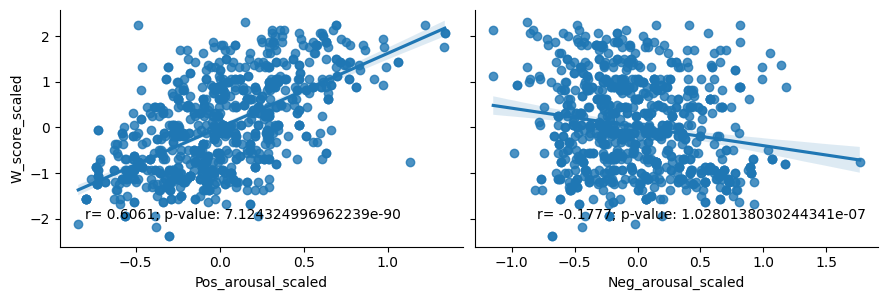

In [195]:
# Correlation between W_score and Pos_arousal and A_score and Pos_arousal for both types of trailers. 
W_PA_All_corr = pearsonr(all_subs_events_df["W_score_scaled"], all_subs_events_df["Pos_arousal_scaled"])
W_NA_All_corr = pearsonr(all_subs_events_df["W_score_scaled"], all_subs_events_df["Neg_arousal_scaled"])

print("The correlation between W_score and Pos_arousal is: " + str(round(W_PA_All_corr[0], 4)) + " with a p-value of: " + str((W_PA_All_corr[1])))
print("The correlation between W_score and Neg_arousal is: " + str(round(W_NA_All_corr[0], 4)) + " with a p-value of: " + str((W_NA_All_corr[1])))

W_PA_NA_behavioral_plot = sns.pairplot(
    all_subs_events_df,
    kind="reg",
    x_vars=["Pos_arousal_scaled", "Neg_arousal_scaled"],
    y_vars=["W_score_scaled"], 
    palette="crest",
    height=3,
    aspect=1.5)

# Add annotation to the plot. 
W_PA_string = "r= " + str(round(W_PA_All_corr[0], 4)) + "; p-value: " + str((W_PA_All_corr[1]))
W_PA_NA_behavioral_plot.axes[0, 0].text(s=W_PA_string, x=-.8, y=-2, fontsize=10)
W_NA_string = "r= " + str(round(W_NA_All_corr[0], 4)) + "; p-value: " + str((W_NA_All_corr[1]))
W_PA_NA_behavioral_plot.axes[0, 1].text(s=W_NA_string, x=-.8, y=-2, fontsize=10)


In [196]:
# Correlation between W_score and Pos_arousal and A_score and Pos_arousal for comedy trailers.
W_PA_comedy_corr = pearsonr(all_subs_events_comedy["W_score_scaled"], all_subs_events_comedy["Pos_arousal_scaled"])
W_NA_comedy_corr = pearsonr(all_subs_events_comedy["W_score_scaled"], all_subs_events_comedy["Neg_arousal_scaled"])

print("The correlation between W_score and Pos_arousal for comedy trailers is: " + str(round(W_PA_comedy_corr[0], 4)) + " with a p-value of: " + str((W_PA_comedy_corr[1])))
print("The correlation between W_score and Neg_arousal for comedy trailers is: " + str(round(W_NA_comedy_corr[0], 4)) + " with a p-value of: " + str((W_NA_comedy_corr[1])))

# Correlation between W_score and Pos_arousal and A_score and Pos_arousal for horror trailers.
W_PA_horror_corr = pearsonr(all_subs_events_horror["W_score_scaled"], all_subs_events_horror["Pos_arousal_scaled"])
W_NA_horror_corr = pearsonr(all_subs_events_horror["W_score_scaled"], all_subs_events_horror["Neg_arousal_scaled"])

print("\nThe correlation between W_score and Pos_arousal for horror trailers is: " + str(round(W_PA_horror_corr[0], 4)) + " with a p-value of: " + str((W_PA_horror_corr[1])))
print("The correlation between W_score and Neg_arousal for horror trailers is: " + str(round(W_NA_horror_corr[0], 4)) + " with a p-value of: " + str((W_NA_horror_corr[1])))


The correlation between W_score and Pos_arousal for comedy trailers is: 0.6479 with a p-value of: 8.638899491577468e-55
The correlation between W_score and Neg_arousal for comedy trailers is: -0.001 with a p-value of: 0.9823944599054152

The correlation between W_score and Pos_arousal for horror trailers is: 0.4789 with a p-value of: 2.2530104650502964e-26
The correlation between W_score and Neg_arousal for horror trailers is: -0.0657 with a p-value of: 0.17076401213709594


Text(-0.8, -2.5, 'H r= 0.4789; p-value: 2.2530104650502964e-26')

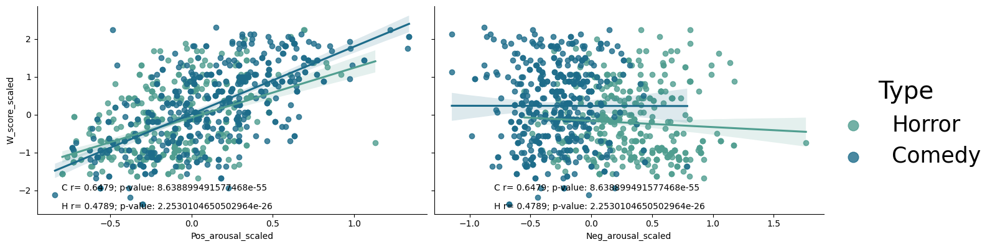

In [197]:
W_PA_NA_bothTrailers_behavioral_plot = sns.pairplot(
    all_subs_events_df,
    kind="reg",
    x_vars=["Pos_arousal_scaled", "Neg_arousal_scaled"],
    y_vars=["W_score_scaled"], 
    palette="crest",
    hue="Type",
    height=4,
    aspect=1.7)

W_comedy_PA_string = "C r= " + str(round(W_PA_comedy_corr[0], 4)) + "; p-value: " + str((W_PA_comedy_corr[1]))
W_horror_PA_string = "H r= " + str(round(W_PA_horror_corr[0], 4)) + "; p-value: " + str((W_PA_horror_corr[1]))
W_PA_NA_bothTrailers_behavioral_plot.axes[0, 0].text(s=W_comedy_PA_string, x=-.8, y=-2, fontsize=10)
W_PA_NA_bothTrailers_behavioral_plot.axes[0, 0].text(s=W_horror_PA_string, x=-.8, y=-2.5, fontsize=10)

W_comedy_NA_string = "C r= " + str(round(W_PA_comedy_corr[0], 4)) + "; p-value: " + str((W_PA_comedy_corr[1]))
W_horror_NA_string = "H r= " + str(round(W_PA_horror_corr[0], 4)) + "; p-value: " + str((W_PA_horror_corr[1]))
W_PA_NA_bothTrailers_behavioral_plot.axes[0, 1].text(s=W_comedy_NA_string, x=-.8, y=-2, fontsize=10)
W_PA_NA_bothTrailers_behavioral_plot.axes[0, 1].text(s=W_horror_NA_string, x=-.8, y=-2.5, fontsize=10)

<Axes: xlabel='Type', ylabel='Neg_arousal_scaled'>

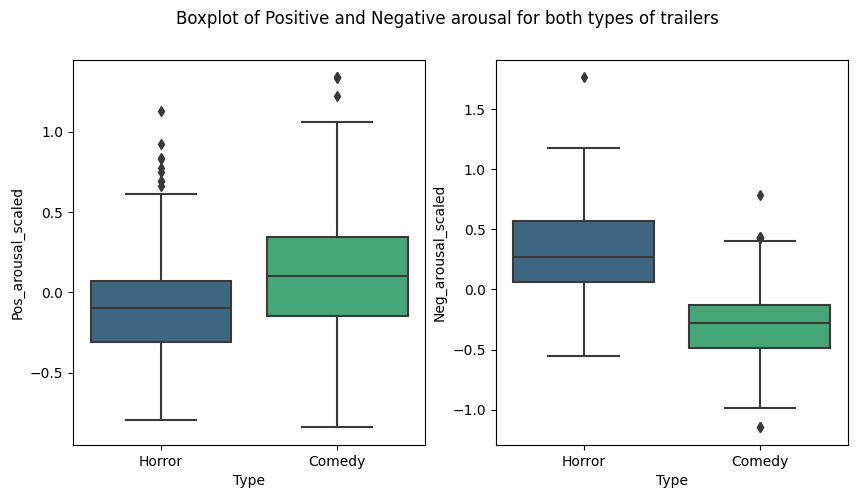

In [198]:
fig, axs = plt.subplots(1, 2, figsize=(10, 5), sharex=True)
fig.suptitle("Boxplot of Positive and Negative arousal for both types of trailers")
sns.boxplot(data=all_subs_events_df, y="Pos_arousal_scaled", x="Type", palette="viridis", ax=axs[0])
sns.boxplot(data=all_subs_events_df, y="Neg_arousal_scaled", x="Type", palette="viridis", ax=axs[1])


<Axes: xlabel='Pos_arousal_scaled', ylabel='Count'>

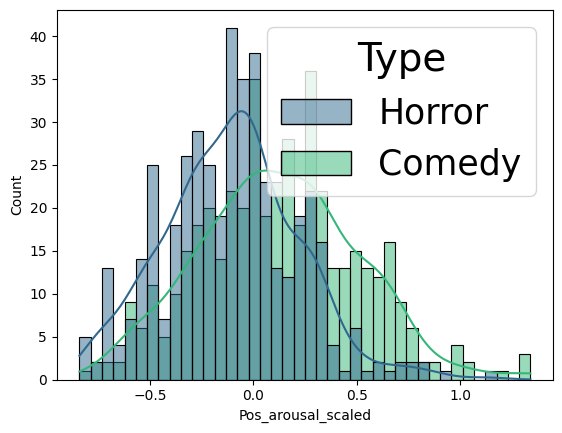

In [199]:
sns.histplot(data=all_subs_events_df, x="Pos_arousal_scaled", hue="Type", kde=True, palette="viridis", bins=40)
#sns.histplot(data=all_subs_events_df, x="Neg_arousal_scaled", hue="Type", kde=True, palette="viridis", bins=40)



<Axes: xlabel='W_score_scaled', ylabel='Count'>

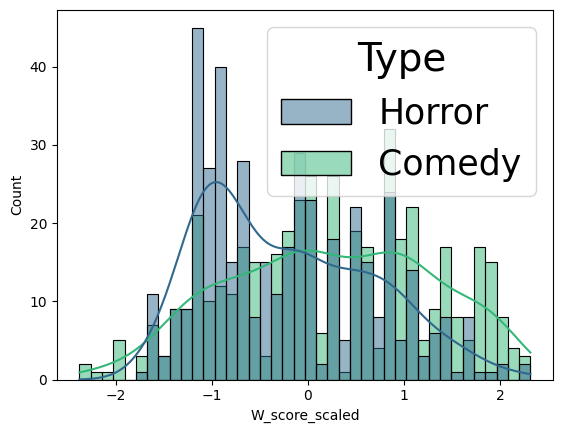

In [200]:
sns.histplot(data=all_subs_events_df, x="W_score_scaled", hue="Type", kde=True, palette="viridis", bins=40)

In [201]:
#sns.displot(data=all_subs_events_df, x="W_score", row="Trailer", kde=True, palette="viridis")

## Neural Activation Whole Average 

The correlation between NAcc_whole activation and positive arousal is: 0.0153 with a p-value of: 0.6494727694015546
The correlation between AIns_whole activation and positive arousal is: -0.02901 with a p-value of: 0.3887328450511124
The correlation between MPFC_whole activation and positive arousal is: -0.02839 with a p-value of: 0.3988451576060092

The correlation between NAcc_whole activation and negative arousal is: 0.05028 with a p-value of: 0.13503404161522167
The correlation between AIns_whole activation and negative arousal is: 0.22645 with a p-value of: 9.374283422423567e-12
The correlation between MPFC_whole activation and negative arousal is: -0.00617 with a p-value of: 0.8545899805701412

The correlation between NAcc_whole activation and watch scores is: 0.01306 with a p-value of: 0.6979414036169326
The correlation between AIns_whole activation and watch scores is: -0.02647 with a p-value of: 0.43153398542810845
The correlation between MPFC_whole activation and watch scores

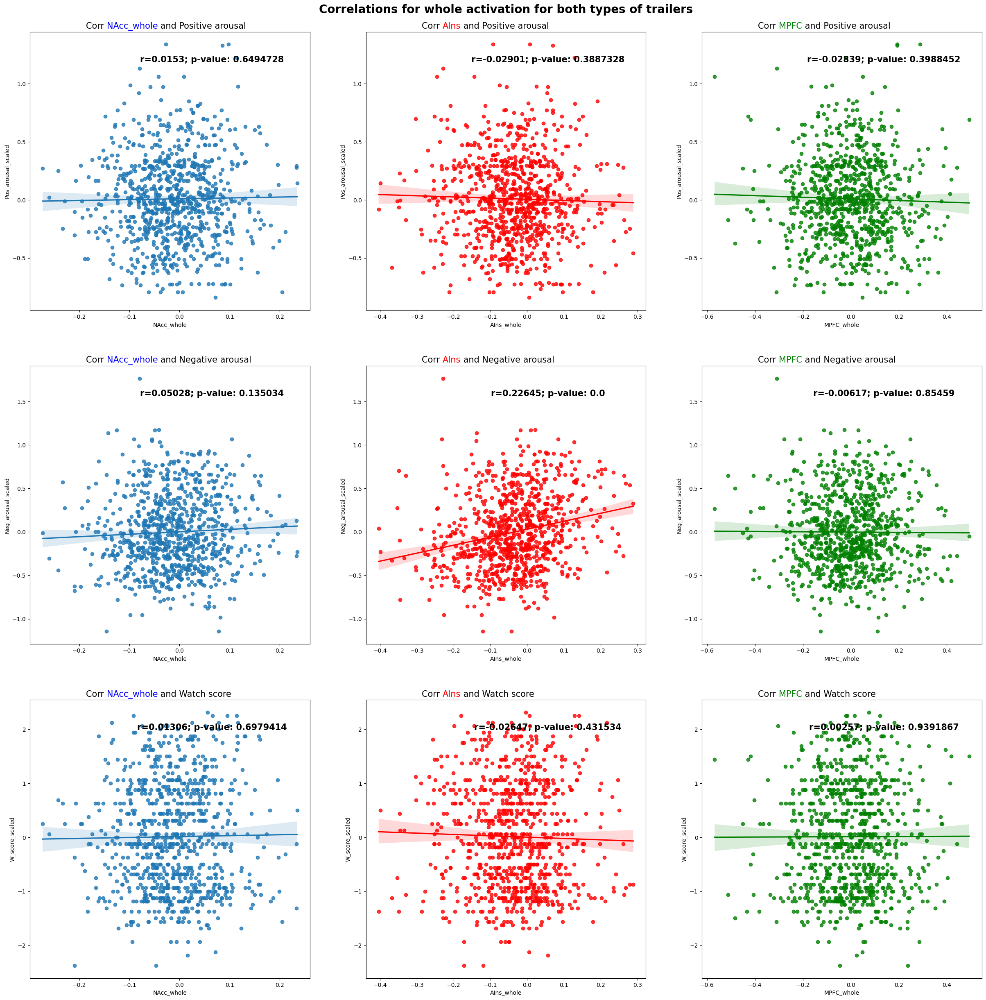

In [202]:
test_title = "Correlations for whole activation for both types of trailers"
compute_and_plot_corrs(all_subs_events_df, "whole", test_title)

The correlation between NAcc_whole activation and positive arousal for Comedy trailers is: 0.08384 with a p-value of: 0.07593869466439827
The correlation between AIns_whole activation and positive arousal for Comedy trailers is: 0.11546 with a p-value of: 0.014369810574141528
The correlation between MPFC_whole activation and positive arousal for Comedy trailers is: -0.03989 with a p-value of: 0.39906969879010984

The correlation between NAcc_whole activation and negative arousal for Comedy trailers is: 0.02016 with a p-value of: 0.6700615572744629
The correlation between AIns_whole activation and negative arousal for Comedy trailers is: 0.04592 with a p-value of: 0.3316772327699165
The correlation between MPFC_whole activation and negative arousal for Comedy trailers is: 0.00395 with a p-value of: 0.9334958105389076

The correlation between NAcc_whole activation and watch scores for Comedy trailers is: 0.08756 with a p-value of: 0.06378006291575665
The correlation between AIns_whole ac

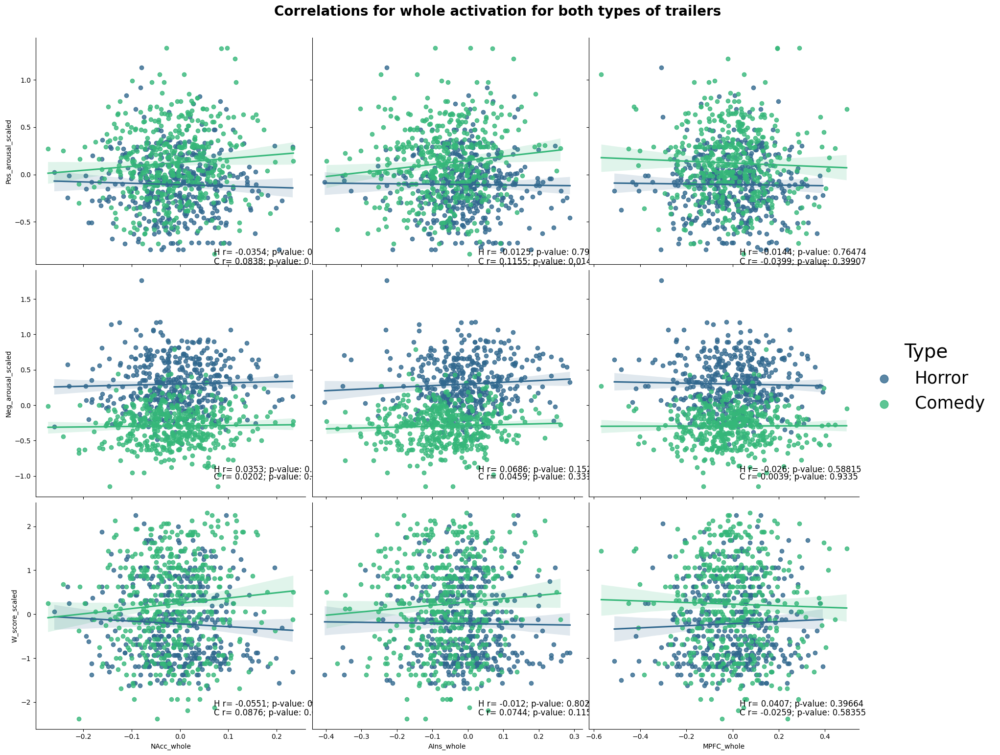

In [203]:

compute_and_plot_both_corrs(all_subs_events_df, all_subs_events_comedy, all_subs_events_horror, "whole", "Correlations for whole activation for both types of trailers")


## Neural Activation Offset 

The correlation between NAcc_offset activation and positive arousal is: -0.02895 with a p-value of: 0.3897003064982893
The correlation between AIns_offset activation and positive arousal is: -0.03917 with a p-value of: 0.2443507778413824
The correlation between MPFC_offset activation and positive arousal is: -0.01323 with a p-value of: 0.6943516722843146

The correlation between NAcc_offset activation and negative arousal is: 0.00384 with a p-value of: 0.909205233127804
The correlation between AIns_offset activation and negative arousal is: 0.187 with a p-value of: 2.0866359250418943e-08
The correlation between MPFC_offset activation and negative arousal is: -0.01452 with a p-value of: 0.6662009958877338

The correlation between NAcc_offset activation and watch scores is: -0.00986 with a p-value of: 0.7695699100648733
The correlation between AIns_offset activation and watch scores is: -0.06648 with a p-value of: 0.04802828166204872
The correlation between MPFC_offset activation and wat

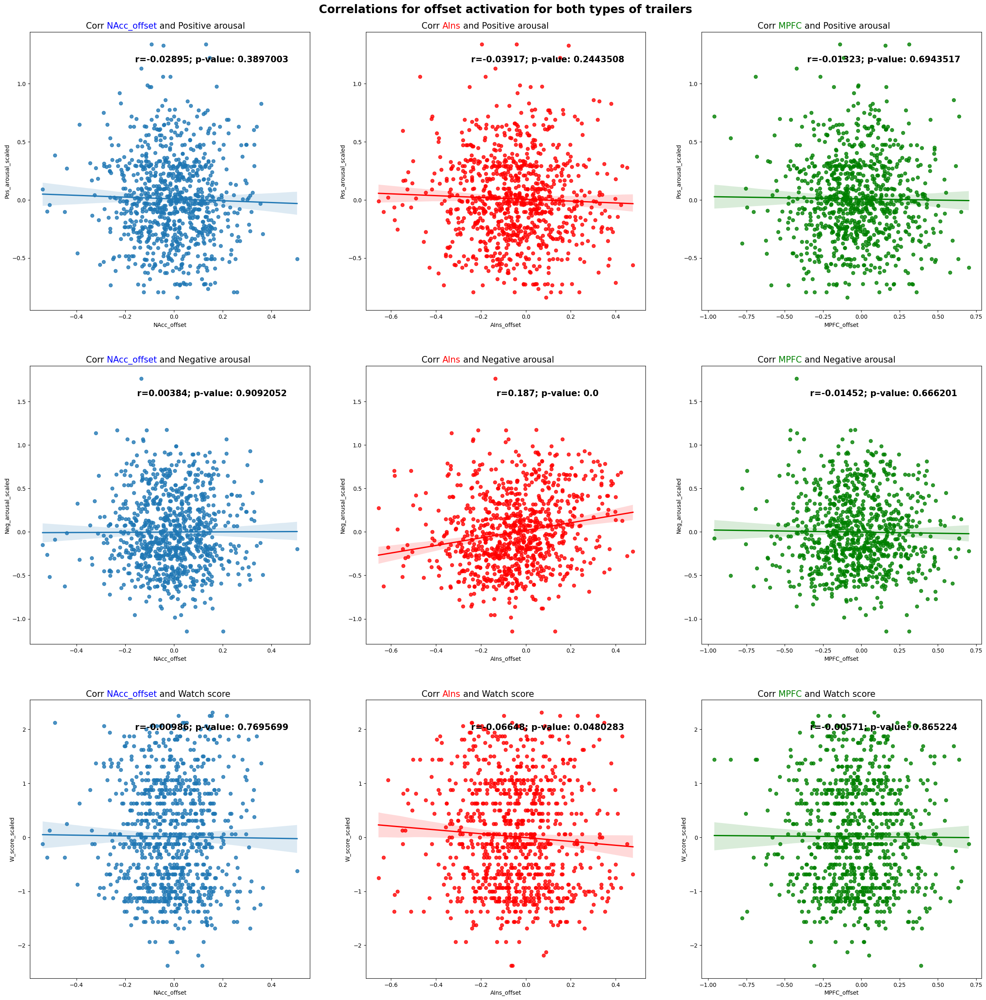

In [204]:
offset_title = "Correlations for offset activation for both types of trailers"
compute_and_plot_corrs(all_subs_events_df, "offset", offset_title)

The correlation between NAcc_offset activation and positive arousal for Comedy trailers is: -0.06049 with a p-value of: 0.2007899890553021
The correlation between AIns_offset activation and positive arousal for Comedy trailers is: 0.05032 with a p-value of: 0.2873351206593652
The correlation between MPFC_offset activation and positive arousal for Comedy trailers is: -0.0065 with a p-value of: 0.89081912316277

The correlation between NAcc_offset activation and negative arousal for Comedy trailers is: -0.03919 with a p-value of: 0.40746485292029033
The correlation between AIns_offset activation and negative arousal for Comedy trailers is: 0.04838 with a p-value of: 0.30639581791187864
The correlation between MPFC_offset activation and negative arousal for Comedy trailers is: -0.01042 with a p-value of: 0.825747245165957

The correlation between NAcc_offset activation and watch scores for Comedy trailers is: -0.03811 with a p-value of: 0.42054089890649005
The correlation between AIns_off

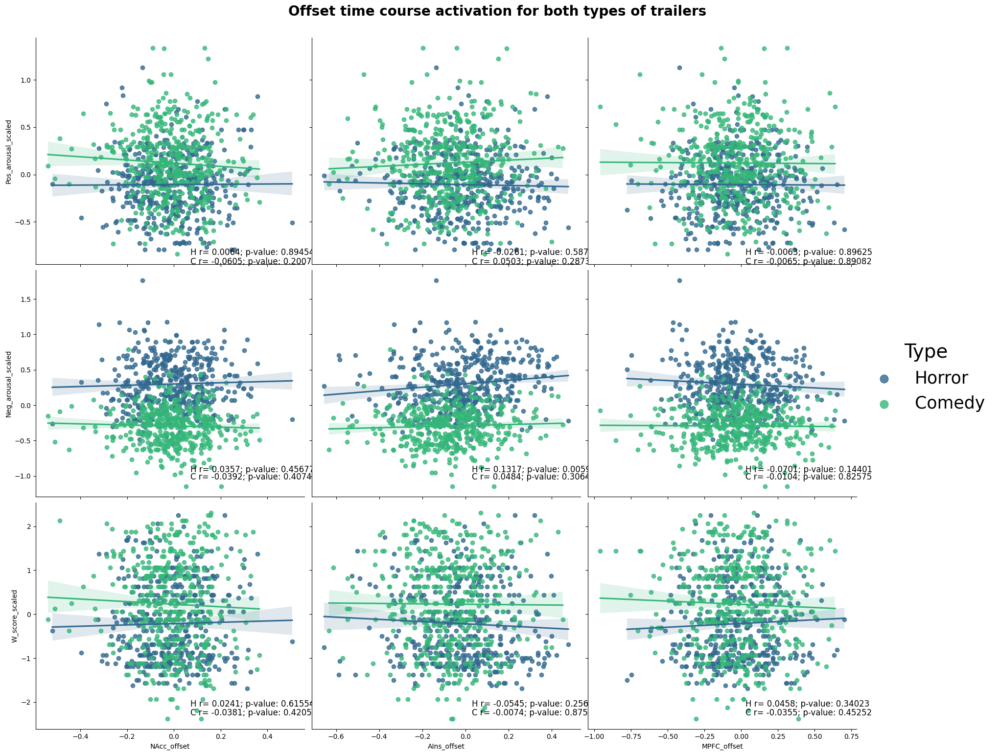

In [205]:
offset_title = 'Offset time course activation for both types of trailers'
compute_and_plot_both_corrs(all_subs_events_df, all_subs_events_comedy, all_subs_events_horror, "offset", offset_title)


# Neural activation middle

The correlation between NAcc_middle activation and positive arousal is: -0.00221 with a p-value of: 0.9476867822837272
The correlation between AIns_middle activation and positive arousal is: -0.03887 with a p-value of: 0.24808441600571157
The correlation between MPFC_middle activation and positive arousal is: -0.06476 with a p-value of: 0.05412963085634676

The correlation between NAcc_middle activation and negative arousal is: 0.06072 with a p-value of: 0.07099463655715951
The correlation between AIns_middle activation and negative arousal is: 0.16938 with a p-value of: 4.0099184504023614e-07
The correlation between MPFC_middle activation and negative arousal is: -0.01125 with a p-value of: 0.7381292242485945

The correlation between NAcc_middle activation and watch scores is: 0.00896 with a p-value of: 0.7900745747359036
The correlation between AIns_middle activation and watch scores is: -0.01352 with a p-value of: 0.6879440675480261
The correlation between MPFC_middle activation and

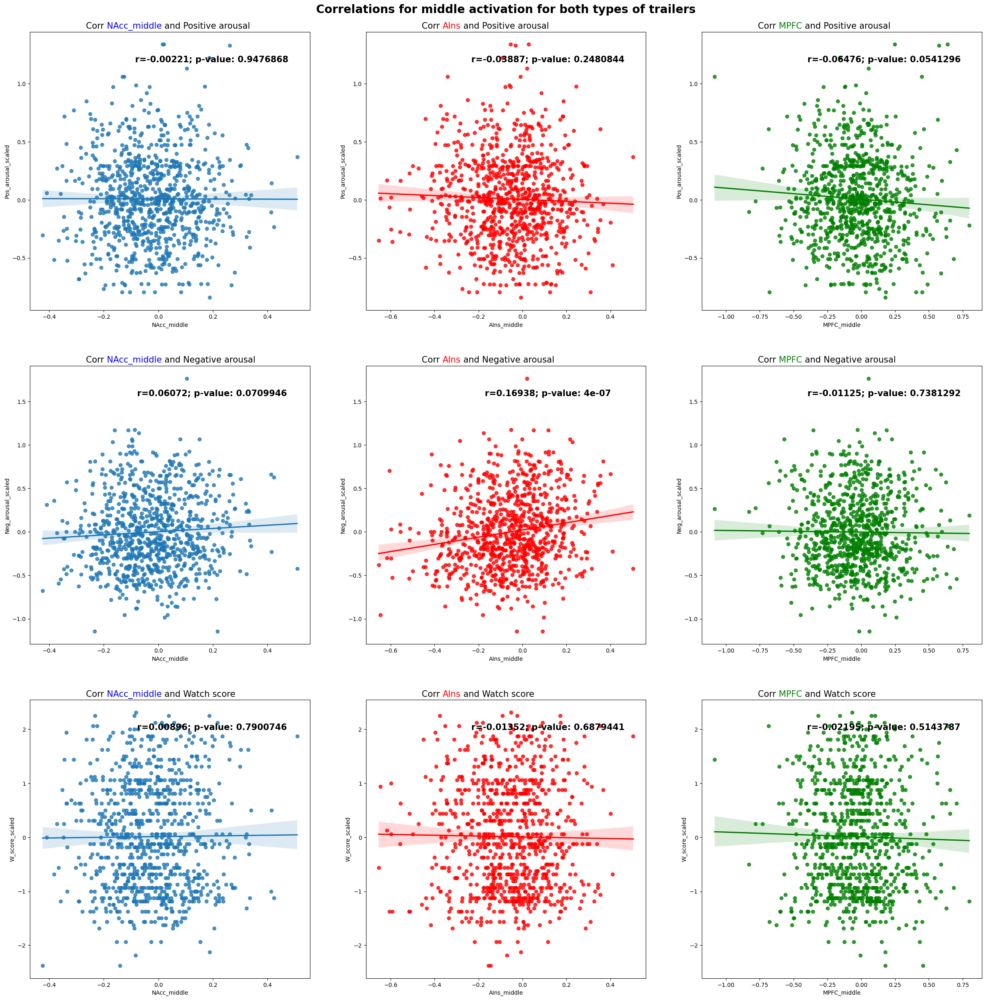

In [206]:
middle_title = "Correlations for middle activation for both types of trailers"
compute_and_plot_corrs(all_subs_events_df, "middle", middle_title)

The correlation between NAcc_middle activation and positive arousal for Comedy trailers is: 0.04144 with a p-value of: 0.3810571464177793
The correlation between AIns_middle activation and positive arousal for Comedy trailers is: 0.05781 with a p-value of: 0.22151819438993722
The correlation between MPFC_middle activation and positive arousal for Comedy trailers is: -0.0619 with a p-value of: 0.19042924426541466

The correlation between NAcc_middle activation and negative arousal for Comedy trailers is: 0.03353 with a p-value of: 0.4785424008338361
The correlation between AIns_middle activation and negative arousal for Comedy trailers is: 0.0134 with a p-value of: 0.7770363603058772
The correlation between MPFC_middle activation and negative arousal for Comedy trailers is: -0.03664 with a p-value of: 0.43866936932419853

The correlation between NAcc_middle activation and watch scores for Comedy trailers is: 0.08589 with a p-value of: 0.0690354064134371
The correlation between AIns_midd

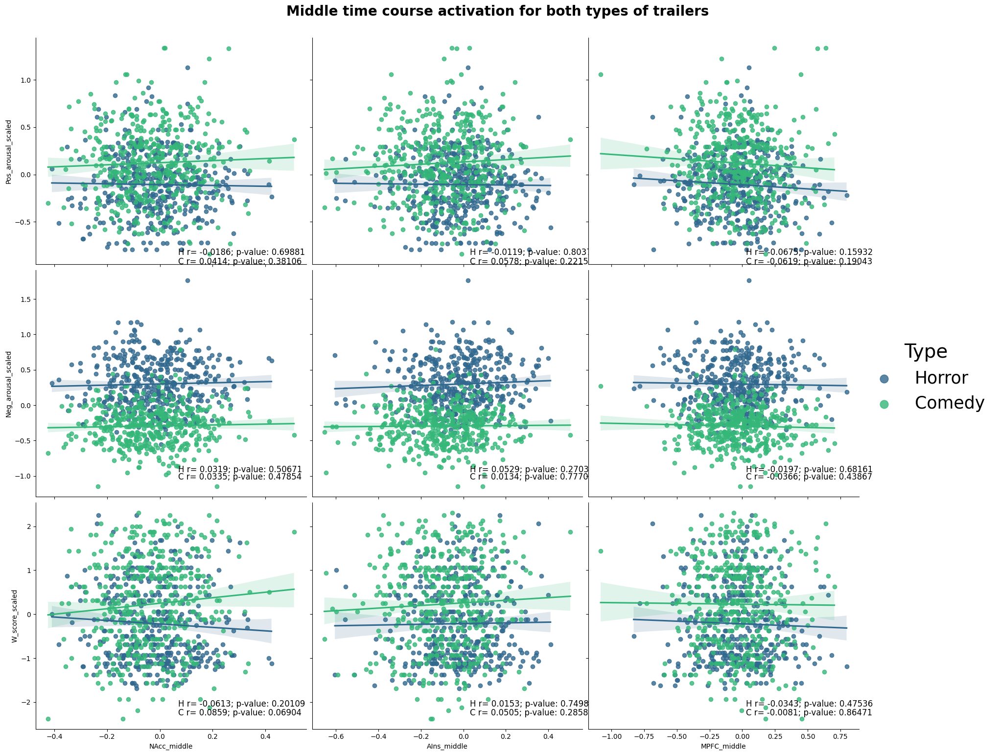

In [207]:
middle_title = 'Middle time course activation for both types of trailers'
compute_and_plot_both_corrs(all_subs_events_df, all_subs_events_comedy, all_subs_events_horror, "middle", middle_title)

## Neural activation onset

The correlation between NAcc_onset activation and positive arousal is: 0.05277 with a p-value of: 0.11671724395155798
The correlation between AIns_onset activation and positive arousal is: 0.02758 with a p-value of: 0.4125722401600957
The correlation between MPFC_onset activation and positive arousal is: 0.02727 with a p-value of: 0.41784801053211645

The correlation between NAcc_onset activation and negative arousal is: 0.01694 with a p-value of: 0.6148313716939366
The correlation between AIns_onset activation and negative arousal is: 0.04372 with a p-value of: 0.1937826427207778
The correlation between MPFC_onset activation and negative arousal is: 0.01479 with a p-value of: 0.6604117955586749

The correlation between NAcc_onset activation and watch scores is: 0.02096 with a p-value of: 0.5334548976587619
The correlation between AIns_onset activation and watch scores is: 0.03548 with a p-value of: 0.29172915019793316
The correlation between MPFC_onset activation and watch scores is: 

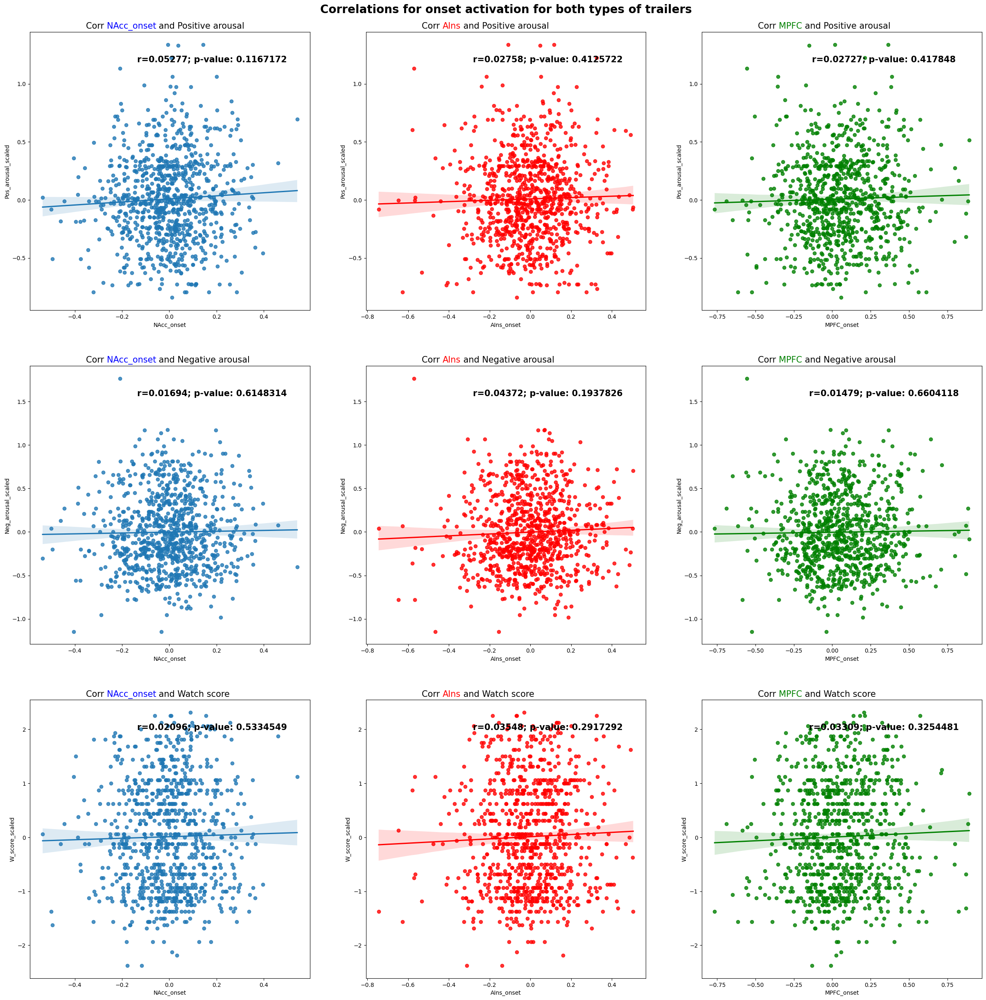

In [208]:
onset_title = "Correlations for onset activation for both types of trailers"
compute_and_plot_corrs(all_subs_events_df, "onset", onset_title)

The correlation between NAcc_onset activation and positive arousal for Comedy trailers is: 0.14558 with a p-value of: 0.0019839784712078917
The correlation between AIns_onset activation and positive arousal for Comedy trailers is: 0.09245 with a p-value of: 0.05026283678477325
The correlation between MPFC_onset activation and positive arousal for Comedy trailers is: -0.00454 with a p-value of: 0.9236430813369

The correlation between NAcc_onset activation and negative arousal for Comedy trailers is: 0.03472 with a p-value of: 0.4630011960805736
The correlation between AIns_onset activation and negative arousal for Comedy trailers is: 0.01883 with a p-value of: 0.6907099043441357
The correlation between MPFC_onset activation and negative arousal for Comedy trailers is: 0.05767 with a p-value of: 0.2226335201364004

The correlation between NAcc_onset activation and watch scores for Comedy trailers is: 0.08748 with a p-value of: 0.06402329090796531
The correlation between AIns_onset activ

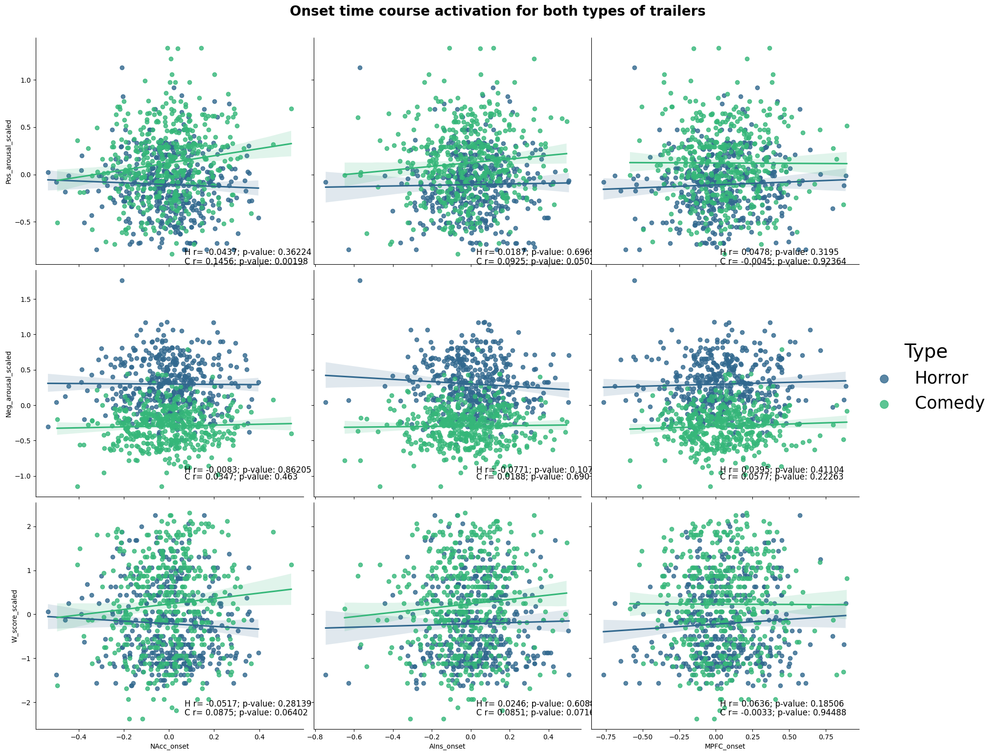

In [209]:
onset_title = 'Onset time course activation for both types of trailers'
compute_and_plot_both_corrs(all_subs_events_df, all_subs_events_comedy, all_subs_events_horror, "onset", onset_title)

## Peak Max

The correlation between NAcc_pos_peak activation and positive arousal is: 0.01476 with a p-value of: 0.6609319411573628
The correlation between AIns_pos_peak activation and positive arousal is: 0.01387 with a p-value of: 0.6803897069925637
The correlation between MPFC_pos_peak activation and positive arousal is: 0.00112 with a p-value of: 0.9734565674522029

The correlation between NAcc_pos_peak activation and negative arousal is: 0.05889 with a p-value of: 0.07997752734270924
The correlation between AIns_pos_peak activation and negative arousal is: 0.12172 with a p-value of: 0.00028410751930482307
The correlation between MPFC_pos_peak activation and negative arousal is: 0.01674 with a p-value of: 0.6188815606384525

The correlation between NAcc_pos_peak activation and watch scores is: 0.00024 with a p-value of: 0.9943952997469435
The correlation between AIns_pos_peak activation and watch scores is: 0.0085 with a p-value of: 0.8006047244066837
The correlation between MPFC_pos_peak acti

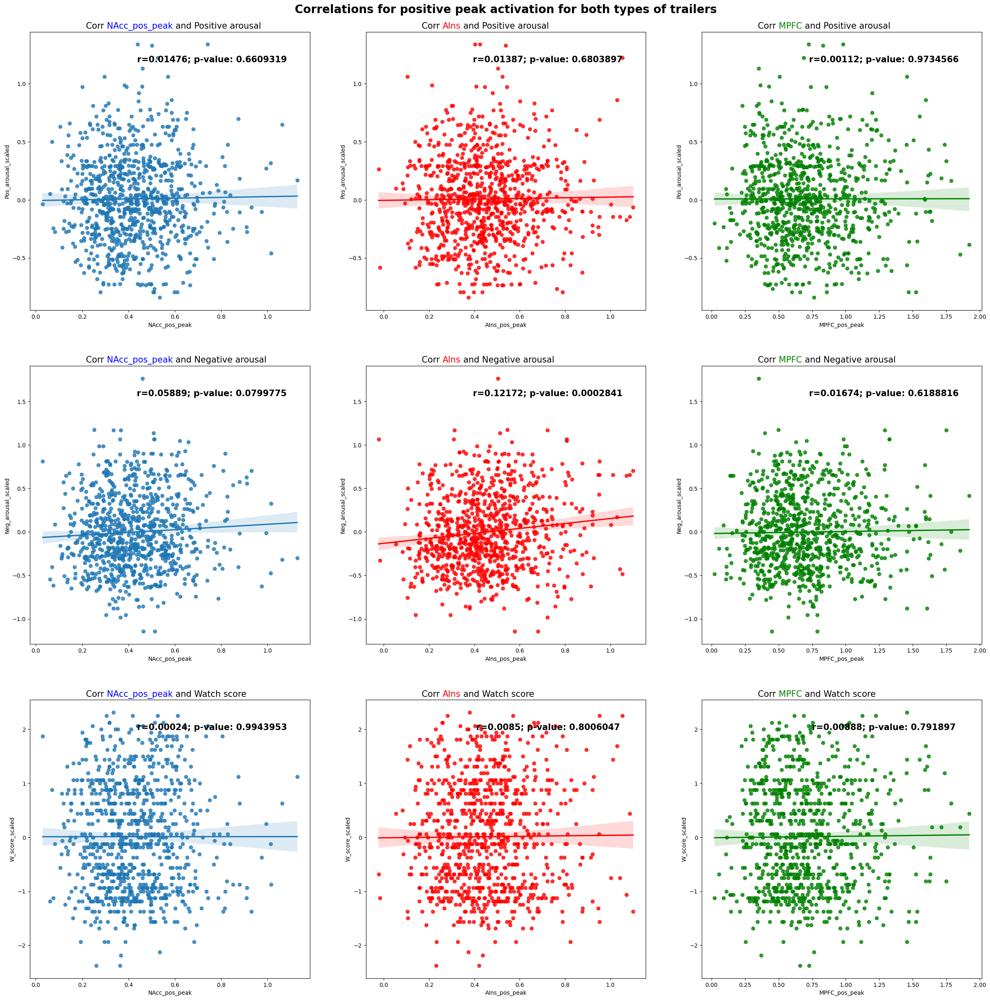

In [210]:
pos_peak_title = "Correlations for positive peak activation for both types of trailers"
compute_and_plot_corrs(all_subs_events_df, "pos_peak", pos_peak_title)

The correlation between NAcc_pos_peak activation and positive arousal for Comedy trailers is: 0.07036 with a p-value of: 0.13661312904867975
The correlation between AIns_pos_peak activation and positive arousal for Comedy trailers is: 0.04241 with a p-value of: 0.36991478979730674
The correlation between MPFC_pos_peak activation and positive arousal for Comedy trailers is: -0.01732 with a p-value of: 0.7144193388617984

The correlation between NAcc_pos_peak activation and negative arousal for Comedy trailers is: 0.00134 with a p-value of: 0.977333060216029
The correlation between AIns_pos_peak activation and negative arousal for Comedy trailers is: -0.01348 with a p-value of: 0.7757900710238264
The correlation between MPFC_pos_peak activation and negative arousal for Comedy trailers is: 0.03832 with a p-value of: 0.41792674869260665

The correlation between NAcc_pos_peak activation and watch scores for Comedy trailers is: 0.08322 with a p-value of: 0.07814859648063822
The correlation b

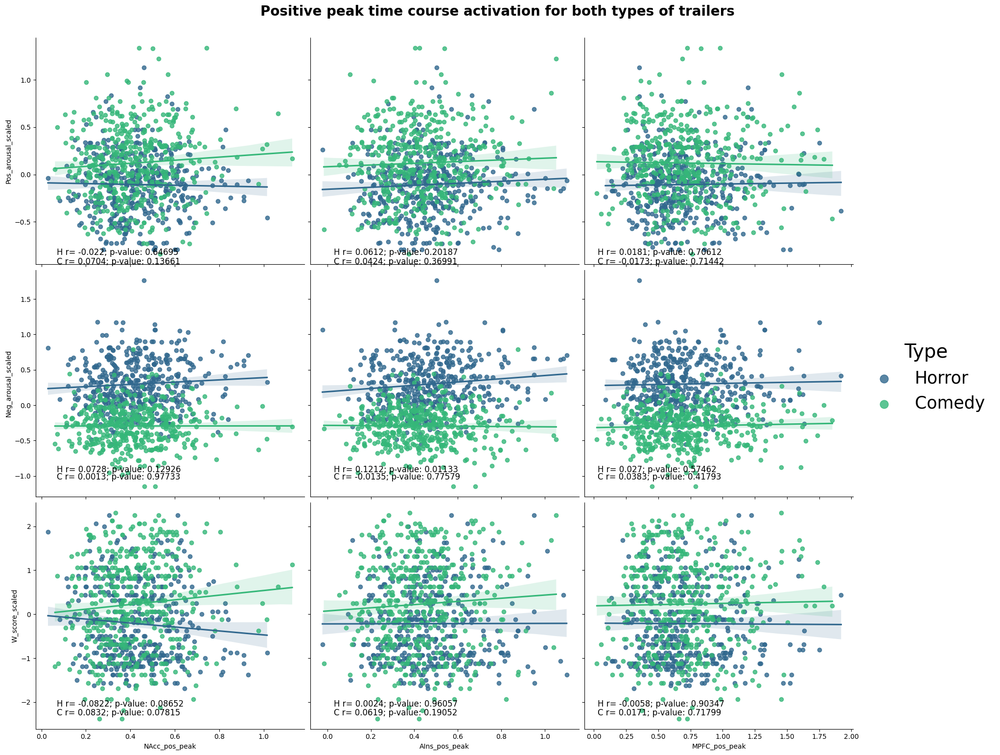

In [211]:
pos_peak_title = 'Positive peak time course activation for both types of trailers'
compute_and_plot_both_corrs(all_subs_events_df, all_subs_events_comedy, all_subs_events_horror, "pos_peak", pos_peak_title)

## Peak min

The correlation between NAcc_neg_peak activation and positive arousal is: 0.03389 with a p-value of: 0.3139443001383828
The correlation between AIns_neg_peak activation and positive arousal is: -0.0457 with a p-value of: 0.17440334098037702
The correlation between MPFC_neg_peak activation and positive arousal is: 0.00586 with a p-value of: 0.86172739294133

The correlation between NAcc_neg_peak activation and negative arousal is: 0.0048 with a p-value of: 0.8865446344928346
The correlation between AIns_neg_peak activation and negative arousal is: 0.15109 with a p-value of: 6.353983200064729e-06
The correlation between MPFC_neg_peak activation and negative arousal is: 0.00546 with a p-value of: 0.8710985627832984

The correlation between NAcc_neg_peak activation and watch scores is: 0.03415 with a p-value of: 0.3101804595698769
The correlation between AIns_neg_peak activation and watch scores is: -0.02931 with a p-value of: 0.3838589738047264
The correlation between MPFC_neg_peak activa

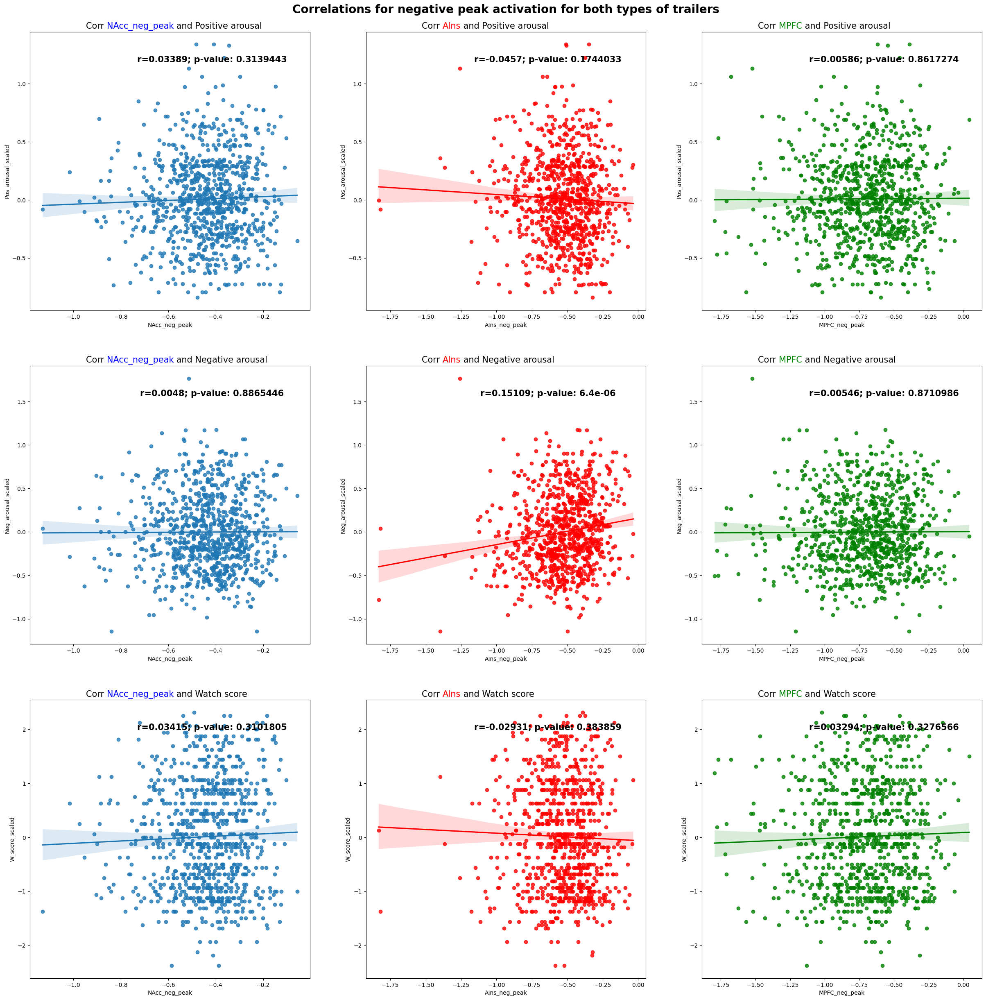

In [212]:
neg_peak_title = "Correlations for negative peak activation for both types of trailers"
compute_and_plot_corrs(all_subs_events_df, "neg_peak", neg_peak_title)

The correlation between NAcc_neg_peak activation and positive arousal for Comedy trailers is: 0.06987 with a p-value of: 0.13935371227205653
The correlation between AIns_neg_peak activation and positive arousal for Comedy trailers is: 0.09324 with a p-value of: 0.04831910077031958
The correlation between MPFC_neg_peak activation and positive arousal for Comedy trailers is: 0.02613 with a p-value of: 0.5807648943760694

The correlation between NAcc_neg_peak activation and negative arousal for Comedy trailers is: 0.04674 with a p-value of: 0.32307034949984886
The correlation between AIns_neg_peak activation and negative arousal for Comedy trailers is: 0.07167 with a p-value of: 0.1294099127812665
The correlation between MPFC_neg_peak activation and negative arousal for Comedy trailers is: -0.01033 with a p-value of: 0.8271812747577073

The correlation between NAcc_neg_peak activation and watch scores for Comedy trailers is: 0.0324 with a p-value of: 0.49350830823194114
The correlation be

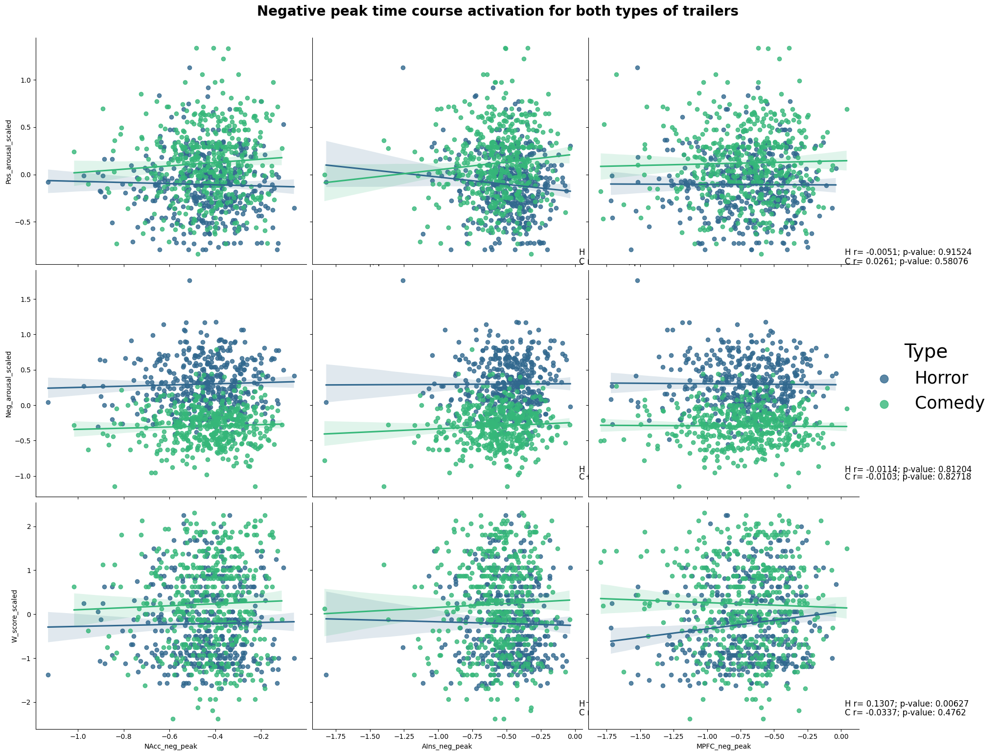

In [213]:
neg_peak_title = 'Negative peak time course activation for both types of trailers'
compute_and_plot_both_corrs(all_subs_events_df, all_subs_events_comedy, all_subs_events_horror, "neg_peak", neg_peak_title)

## Positive peak (slope) 

The correlation between NAcc_slope_peak activation and positive arousal is: 0.03485 with a p-value of: 0.39810822852831623
The correlation between AIns_slope_peak activation and positive arousal is: 0.00557 with a p-value of: 0.8925392600258363
The correlation between MPFC_slope_peak activation and positive arousal is: 0.02031 with a p-value of: 0.6225608153891198

The correlation between NAcc_slope_peak activation and negative arousal is: 0.05314 with a p-value of: 0.19740245452316496
The correlation between AIns_slope_peak activation and negative arousal is: -0.03513 with a p-value of: 0.39431617205800784
The correlation between MPFC_slope_peak activation and negative arousal is: 0.01898 with a p-value of: 0.6455178439315141

The correlation between NAcc_slope_peak activation and watch scores is: 0.0424 with a p-value of: 0.3038748805774333
The correlation between AIns_slope_peak activation and watch scores is: -0.05181 with a p-value of: 0.2088576642826511
The correlation between MP

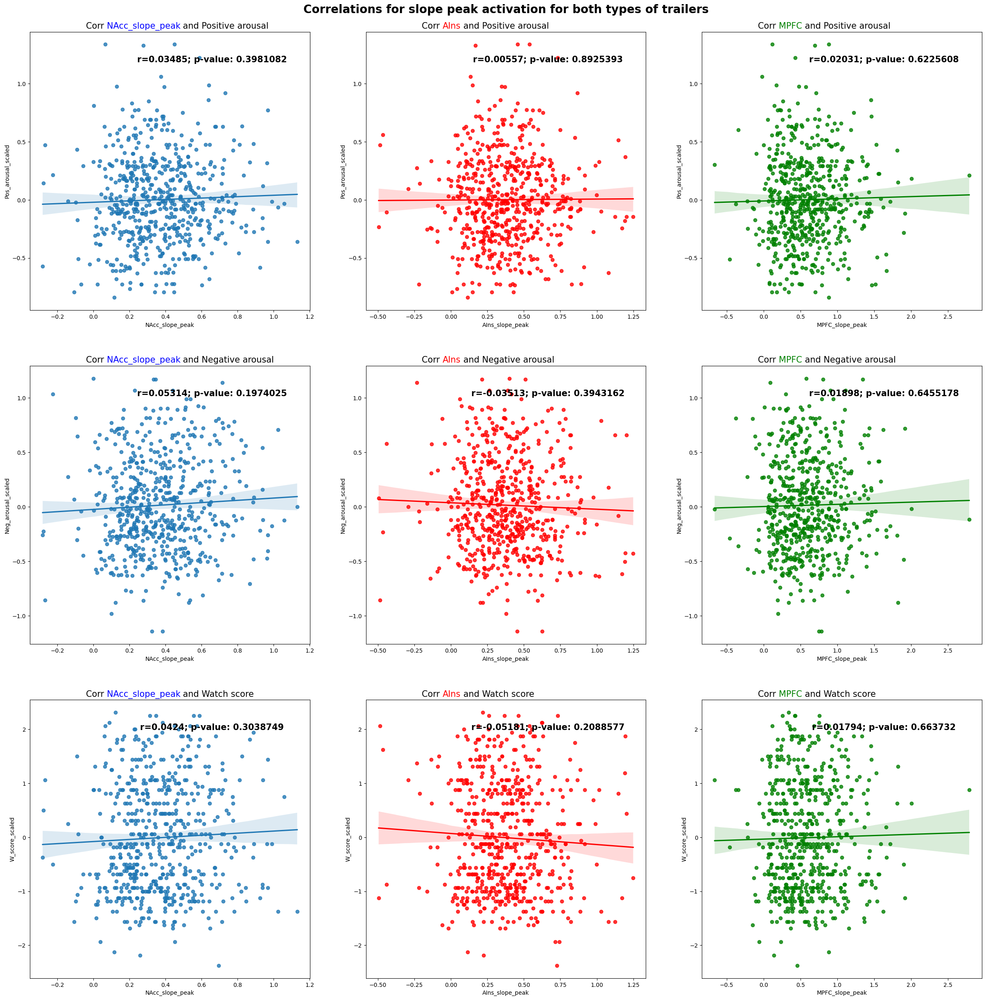

In [214]:
# Drop outliers from delta peaks.
all_subs_events_slope_df = all_subs_events_df[(all_subs_events_df["NAcc_slope_peak"] != 0) & (all_subs_events_df["AIns_slope_peak"] != 0) & (all_subs_events_df["MPFC_slope_peak"] != 0)]
all_subs_events_slope_horror_df = all_subs_events_slope_df[all_subs_events_slope_df["Type"] == "Horror"]
all_subs_events_slope_comedy_df = all_subs_events_slope_df[all_subs_events_slope_df["Type"] == "Comedy"]


pos_slope_peak_title = "Correlations for slope peak activation for both types of trailers"
compute_and_plot_corrs(all_subs_events_slope_df, "slope_peak", pos_slope_peak_title)

The correlation between NAcc_slope_peak activation and positive arousal for Comedy trailers is: 0.00406 with a p-value of: 0.9452877749372081
The correlation between AIns_slope_peak activation and positive arousal for Comedy trailers is: -0.08964 with a p-value of: 0.12908440106638677
The correlation between MPFC_slope_peak activation and positive arousal for Comedy trailers is: -0.03138 with a p-value of: 0.5958926004577323

The correlation between NAcc_slope_peak activation and negative arousal for Comedy trailers is: 0.07196 with a p-value of: 0.22344762095533033
The correlation between AIns_slope_peak activation and negative arousal for Comedy trailers is: -0.00063 with a p-value of: 0.9915147810960823
The correlation between MPFC_slope_peak activation and negative arousal for Comedy trailers is: 0.09361 with a p-value of: 0.1129291906983421

The correlation between NAcc_slope_peak activation and watch scores for Comedy trailers is: 0.03149 with a p-value of: 0.5945837929079321
The

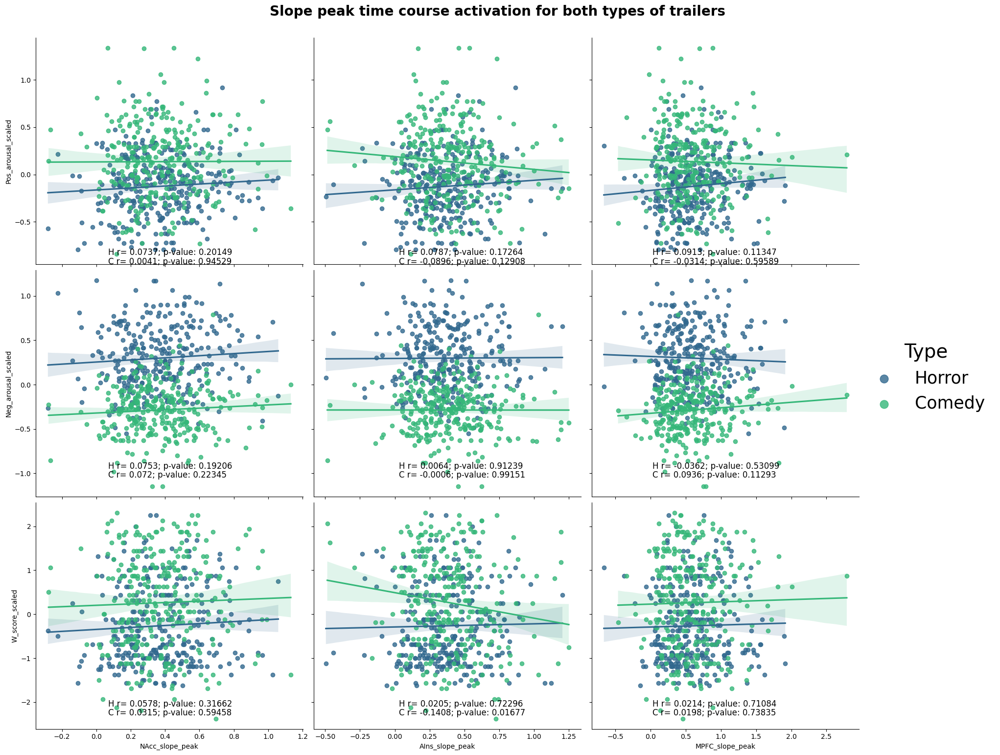

In [215]:
pos_slope_peak_title = 'Slope peak time course activation for both types of trailers'
compute_and_plot_both_corrs(all_subs_events_slope_df, all_subs_events_slope_comedy_df, all_subs_events_slope_horror_df, "slope_peak", pos_slope_peak_title)


## Narrow slope peak 

In [216]:
#narrow_slope_peak_title = "Correlations for narrow slope peak activation for both types of trailers"
#compute_and_plot_corrs(all_subs_events_df, "narrow_slope_peak", narrow_slope_peak_title)

In [217]:
#narrow_slope_peak_title = 'Narrow slope peak time course activation for both types of trailers'
#compute_and_plot_both_corrs(all_subs_events_df, all_subs_events_comedy, all_subs_events_horror, "narrow_slope_peak", narrow_slope_peak_title)

## Positive peak (delta)

In [218]:
#delta_peak_title = "Correlations for delta peak activation for both types of trailers"
#compute_and_plot_corrs(all_subs_events_df, "delta_peak", delta_peak_title)

In [219]:
#delta_peak_title = 'Delta peak time course activation for both types of trailers'
#compute_and_plot_both_corrs(all_subs_events_df, all_subs_events_comedy, all_subs_events_horror, "delta_peak", delta_peak_title)

## Narrow delta peak 

In [220]:
#narrow_delta_peak_title = "Correlations for narrow delta peak activation for both types of trailers"
#compute_and_plot_corrs(all_subs_events_df, "narrow_delta_peak", narrow_delta_peak_title)

In [221]:
#narrow_delta_peak_title = 'Narrow delta peak time course activation for both types of trailers'
#compute_and_plot_both_corrs(all_subs_events_df, all_subs_events_comedy, all_subs_events_horror, "narrow_delta_peak", narrow_delta_peak_title)

## Neural ISC

In [222]:
# Correlation with Positive Arousal.
NAcc_PA_ISC_All_corr = pearsonr(all_subs_events_df["NAcc_ISC"], all_subs_events_df["Pos_arousal_scaled"])
AIns_PA_ISC_All_corr = pearsonr(all_subs_events_df["AIns_ISC"], all_subs_events_df["Pos_arousal_scaled"])
MPFC_PA_ISC_All_corr = pearsonr(all_subs_events_df["MPFC_ISC"], all_subs_events_df["Pos_arousal_scaled"])

# Correlation with Negative Arousal.
NAcc_NA_ISC_All_corr = pearsonr(all_subs_events_df["NAcc_ISC"], all_subs_events_df["Neg_arousal_scaled"])
AIns_NA_ISC_All_corr = pearsonr(all_subs_events_df["AIns_ISC"], all_subs_events_df["Neg_arousal_scaled"])
MPFC_NA_ISC_All_corr = pearsonr(all_subs_events_df["MPFC_ISC"], all_subs_events_df["Neg_arousal_scaled"])

# Correlation with Watch Scores.
NAcc_W_ISC_All_corr = pearsonr(all_subs_events_df["NAcc_ISC"], all_subs_events_df["W_score_scaled"])
AIns_W_ISC_All_corr = pearsonr(all_subs_events_df["AIns_ISC"], all_subs_events_df["W_score_scaled"])
MPFC_W_ISC_All_corr = pearsonr(all_subs_events_df["MPFC_ISC"], all_subs_events_df["W_score_scaled"])

print("For both types of trailers, the correlation between NAcc ISC activation and positive arousal is: " + str(round(NAcc_PA_ISC_All_corr[0], 5)) + " with a p-value of: " + str((NAcc_PA_ISC_All_corr[1])))
print("For both types of trailers, the correlation between AIns ISC activation and positive arousal is: " + str(round(AIns_PA_ISC_All_corr[0], 5)) + " with a p-value of: " + str((AIns_PA_ISC_All_corr[1])))
print("For both types of trailers, the correlation between MPFC ISC activation and positive arousal is: " + str(round(MPFC_PA_ISC_All_corr[0], 5)) + " with a p-value of: " + str((MPFC_PA_ISC_All_corr[1])))

print("\nFor both types of trailers, the correlation between NAcc ISC activation and negative arousal is: " + str(round(NAcc_NA_ISC_All_corr[0], 5)) + " with a p-value of: " + str((NAcc_NA_ISC_All_corr[1])))
print("For both types of trailers, the correlation between AIns ISC activation and negative arousal is: " + str(round(AIns_NA_ISC_All_corr[0], 5)) + " with a p-value of: " + str((AIns_NA_ISC_All_corr[1])))
print("For both types of trailers, the correlation between MPFC ISC activation and negative arousal is: " + str(round(MPFC_NA_ISC_All_corr[0], 5)) + " with a p-value of: " + str((MPFC_NA_ISC_All_corr[1])))

print("\nFor both types of trailers, the correlation between NAcc ISC activation and watch scores is: " + str(round(NAcc_W_ISC_All_corr[0], 5)) + " with a p-value of: " + str((NAcc_W_ISC_All_corr[1])))
print("For both types of trailers, the correlation between AIns ISC activation and watch scores is: " + str(round(AIns_W_ISC_All_corr[0], 5)) + " with a p-value of: " + str((AIns_W_ISC_All_corr[1])))
print("For both types of trailers, the correlation between MPFC ISC activation and watch scores is: " + str(round(MPFC_W_ISC_All_corr[0], 5)) + " with a p-value of: " + str((MPFC_W_ISC_All_corr[1])))


For both types of trailers, the correlation between NAcc ISC activation and positive arousal is: 0.03059 with a p-value of: 0.36330308940741357
For both types of trailers, the correlation between AIns ISC activation and positive arousal is: 0.03259 with a p-value of: 0.33288239076392473
For both types of trailers, the correlation between MPFC ISC activation and positive arousal is: 0.07087 with a p-value of: 0.03503661814739463

For both types of trailers, the correlation between NAcc ISC activation and negative arousal is: -0.00975 with a p-value of: 0.7721968775613633
For both types of trailers, the correlation between AIns ISC activation and negative arousal is: -0.01925 with a p-value of: 0.5674819540174162
For both types of trailers, the correlation between MPFC ISC activation and negative arousal is: 0.07518 with a p-value of: 0.02532676475451254

For both types of trailers, the correlation between NAcc ISC activation and watch scores is: 0.08044 with a p-value of: 0.016685269114

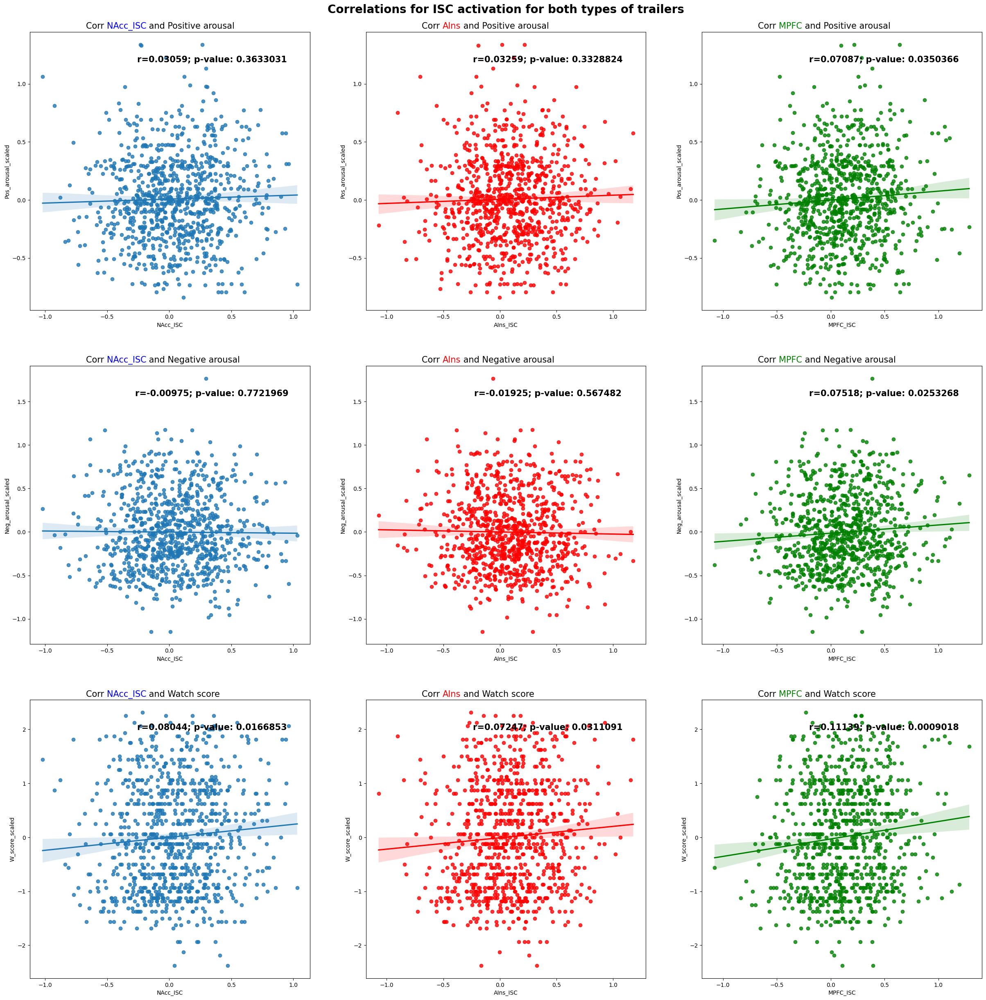

In [223]:
ISC_all_corr = [NAcc_PA_ISC_All_corr, NAcc_NA_ISC_All_corr, NAcc_W_ISC_All_corr, AIns_PA_ISC_All_corr, AIns_NA_ISC_All_corr, AIns_W_ISC_All_corr, MPFC_PA_ISC_All_corr, MPFC_NA_ISC_All_corr, MPFC_W_ISC_All_corr]
plot_correlations(all_subs_events_df, ISC_all_corr, "ISC", "Correlations for ISC activation for both types of trailers")


In [224]:
# ISC Neural Activation and PA-NA for Comedy Trailers.
NAcc_PA_ISC_C_corr = pearsonr(all_subs_events_comedy["NAcc_ISC"], all_subs_events_comedy["Pos_arousal_scaled"])
AIns_PA_ISC_C_corr = pearsonr(all_subs_events_comedy["AIns_ISC"], all_subs_events_comedy["Pos_arousal_scaled"])
MPFC_PA_ISC_C_corr = pearsonr(all_subs_events_comedy["MPFC_ISC"], all_subs_events_comedy["Pos_arousal_scaled"])

NAcc_NA_ISC_C_corr = pearsonr(all_subs_events_comedy["NAcc_ISC"], all_subs_events_comedy["Neg_arousal_scaled"])
AIns_NA_ISC_C_corr = pearsonr(all_subs_events_comedy["AIns_ISC"], all_subs_events_comedy["Neg_arousal_scaled"])
MPFC_NA_ISC_C_corr = pearsonr(all_subs_events_comedy["MPFC_ISC"], all_subs_events_comedy["Neg_arousal_scaled"])

NAcc_W_ISC_C_corr = pearsonr(all_subs_events_comedy["NAcc_ISC"], all_subs_events_comedy["W_score_scaled"])
AIns_W_ISC_C_corr = pearsonr(all_subs_events_comedy["AIns_ISC"], all_subs_events_comedy["W_score_scaled"])
MPFC_W_ISC_C_corr = pearsonr(all_subs_events_comedy["MPFC_ISC"], all_subs_events_comedy["W_score_scaled"])

print("For comedy trailers, the correlation between NAcc ISC activation and positive arousal is: " + str(round(NAcc_PA_ISC_C_corr[0], 5)) + " with a p-value of: " + str((NAcc_PA_ISC_C_corr[1])))
print("For comedy trailers, the correlation between AIns ISC activation and positive arousal is: " + str(round(AIns_PA_ISC_C_corr[0], 5)) + " with a p-value of: " + str((AIns_PA_ISC_C_corr[1])))
print("For comedy trailers, the correlation between MPFC ISC activation and positive arousal is: " + str(round(MPFC_PA_ISC_C_corr[0], 5)) + " with a p-value of: " + str((MPFC_PA_ISC_C_corr[1])))

print("\nFor comedy trailers, the correlation between NAcc ISC activation and negative arousal is: " + str(round(NAcc_NA_ISC_C_corr[0], 5)) + " with a p-value of: " + str((NAcc_NA_ISC_C_corr[1])))
print("For comedy trailers, the correlation between AIns ISC activation and negative arousal is: " + str(round(AIns_NA_ISC_C_corr[0], 5)) + " with a p-value of: " + str((AIns_NA_ISC_C_corr[1])))
print("For comedy trailers, the correlation between MPFC ISC activation and negative arousal is: " + str(round(MPFC_NA_ISC_C_corr[0], 5)) + " with a p-value of: " + str((MPFC_NA_ISC_C_corr[1])))

print("\nFor comedy trailers, the correlation between NAcc ISC activation and watch scores is: " + str(round(NAcc_W_ISC_C_corr[0], 5)) + " with a p-value of: " + str((NAcc_W_ISC_C_corr[1])))
print("For comedy trailers, the correlation between AIns ISC activation and watch scores is: " + str(round(AIns_W_ISC_C_corr[0], 5)) + " with a p-value of: " + str((AIns_W_ISC_C_corr[1])))
print("For comedy trailers, the correlation between MPFC ISC activation and watch scores is: " + str(round(MPFC_W_ISC_C_corr[0], 5)) + " with a p-value of: " + str((MPFC_W_ISC_C_corr[1])))


For comedy trailers, the correlation between NAcc ISC activation and positive arousal is: 0.10722 with a p-value of: 0.023076234072058506
For comedy trailers, the correlation between AIns ISC activation and positive arousal is: 0.04176 with a p-value of: 0.37740244934689116
For comedy trailers, the correlation between MPFC ISC activation and positive arousal is: 0.13066 with a p-value of: 0.005557903671207498

For comedy trailers, the correlation between NAcc ISC activation and negative arousal is: -0.01025 with a p-value of: 0.8285430449329388
For comedy trailers, the correlation between AIns ISC activation and negative arousal is: -0.01753 with a p-value of: 0.7110693525817442
For comedy trailers, the correlation between MPFC ISC activation and negative arousal is: 0.0272 with a p-value of: 0.5654481257660818

For comedy trailers, the correlation between NAcc ISC activation and watch scores is: 0.13144 with a p-value of: 0.005279097913476879
For comedy trailers, the correlation betwe

In [225]:
# ISC Neural Activation and PA-NA for Horror Trailers.
NAcc_PA_ISC_H_corr = pearsonr(all_subs_events_horror["NAcc_ISC"], all_subs_events_horror["Pos_arousal_scaled"])
AIns_PA_ISC_H_corr = pearsonr(all_subs_events_horror["AIns_ISC"], all_subs_events_horror["Pos_arousal_scaled"])
MPFC_PA_ISC_H_corr = pearsonr(all_subs_events_horror["MPFC_ISC"], all_subs_events_horror["Pos_arousal_scaled"])

NAcc_NA_ISC_H_corr = pearsonr(all_subs_events_horror["NAcc_ISC"], all_subs_events_horror["Neg_arousal_scaled"])
AIns_NA_ISC_H_corr = pearsonr(all_subs_events_horror["AIns_ISC"], all_subs_events_horror["Neg_arousal_scaled"])
MPFC_NA_ISC_H_corr = pearsonr(all_subs_events_horror["MPFC_ISC"], all_subs_events_horror["Neg_arousal_scaled"])

NAcc_W_ISC_H_corr = pearsonr(all_subs_events_horror["NAcc_ISC"], all_subs_events_horror["W_score_scaled"])
AIns_W_ISC_H_corr = pearsonr(all_subs_events_horror["AIns_ISC"], all_subs_events_horror["W_score_scaled"])
MPFC_W_ISC_H_corr = pearsonr(all_subs_events_horror["MPFC_ISC"], all_subs_events_horror["W_score_scaled"])

print("For horror trailers, the correlation between NAcc ISC activation and positive arousal is: " + str(round(NAcc_PA_ISC_H_corr[0], 5)) + " with a p-value of: " + str((NAcc_PA_ISC_H_corr[1])))
print("For horror trailers, the correlation between AIns ISC activation and positive arousal is: " + str(round(AIns_PA_ISC_H_corr[0], 5)) + " with a p-value of: " + str((AIns_PA_ISC_H_corr[1])))
print("For horror trailers, the correlation between MPFC ISC activation and positive arousal is: " + str(round(MPFC_PA_ISC_H_corr[0], 5)) + " with a p-value of: " + str((MPFC_PA_ISC_H_corr[1])))

print("\nFor horror trailers, the correlation between NAcc ISC activation and negative arousal is: " + str(round(NAcc_NA_ISC_H_corr[0], 5)) + " with a p-value of: " + str((NAcc_NA_ISC_H_corr[1])))
print("For horror trailers, the correlation between AIns ISC activation and negative arousal is: " + str(round(AIns_NA_ISC_H_corr[0], 5)) + " with a p-value of: " + str((AIns_NA_ISC_H_corr[1])))
print("For horror trailers, the correlation between MPFC ISC activation and negative arousal is: " + str(round(MPFC_NA_ISC_H_corr[0], 5)) + " with a p-value of: " + str((MPFC_NA_ISC_H_corr[1])))

print("\nFor horror trailers, the correlation between NAcc ISC activation and watch scores is: " + str(round(NAcc_W_ISC_H_corr[0], 5)) + " with a p-value of: " + str((NAcc_W_ISC_H_corr[1])))
print("For horror trailers, the correlation between AIns ISC activation and watch scores is: " + str(round(AIns_W_ISC_H_corr[0], 5)) + " with a p-value of: " + str((AIns_W_ISC_H_corr[1])))
print("For horror trailers, the correlation between MPFC ISC activation and watch scores is: " + str(round(MPFC_W_ISC_H_corr[0], 5)) + " with a p-value of: " + str((MPFC_W_ISC_H_corr[1])))



For horror trailers, the correlation between NAcc ISC activation and positive arousal is: -0.05959 with a p-value of: 0.2142707749718412
For horror trailers, the correlation between AIns ISC activation and positive arousal is: -0.00835 with a p-value of: 0.8619665531069632
For horror trailers, the correlation between MPFC ISC activation and positive arousal is: 0.03705 with a p-value of: 0.44034197575327244

For horror trailers, the correlation between NAcc ISC activation and negative arousal is: -0.03918 with a p-value of: 0.4144297633407083
For horror trailers, the correlation between AIns ISC activation and negative arousal is: 0.0455 with a p-value of: 0.34319197748571983
For horror trailers, the correlation between MPFC ISC activation and negative arousal is: 0.0916 with a p-value of: 0.05597095064605579

For horror trailers, the correlation between NAcc ISC activation and watch scores is: 0.0233 with a p-value of: 0.6275975642508397
For horror trailers, the correlation between AI

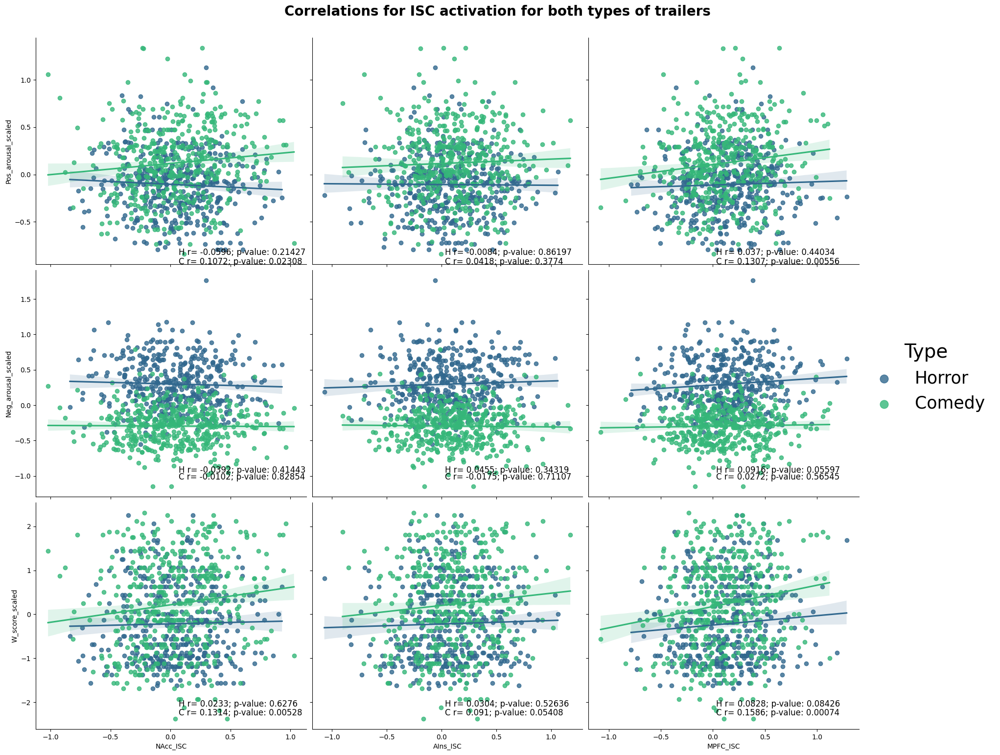

In [226]:
ISC_comedy_corr = [NAcc_PA_ISC_C_corr, NAcc_NA_ISC_C_corr, NAcc_W_ISC_C_corr, AIns_PA_ISC_C_corr, AIns_NA_ISC_C_corr, AIns_W_ISC_C_corr, MPFC_PA_ISC_C_corr, MPFC_NA_ISC_C_corr, MPFC_W_ISC_C_corr]
ISC_horror_corr = [NAcc_PA_ISC_H_corr, NAcc_NA_ISC_H_corr, NAcc_W_ISC_H_corr, AIns_PA_ISC_H_corr, AIns_NA_ISC_H_corr, AIns_W_ISC_H_corr, MPFC_PA_ISC_H_corr, MPFC_NA_ISC_H_corr, MPFC_W_ISC_H_corr]
plot_correlations3_bothTrailers(all_subs_events_df, "ISC", ISC_comedy_corr, ISC_horror_corr, "Correlations for ISC activation for both types of trailers")


In [227]:
# Open a datasets directory. 
fd = os.open("/Users/luisalvarez/Documents/GitHub/RM_Thesis_Neuroforecasting/ProcessedData", os.O_RDONLY)


# Use os.fchdir() method to change the current dir/folder.
os.fchdir(fd)

# Safe check- Print current working directory
print("Current working dir : %s" % os.getcwd())

root_path = os.getcwd()

Current working dir : /Users/luisalvarez/Documents/GitHub/RM_Thesis_Neuroforecasting/ProcessedData


In [228]:
# After dropping outliers from the neural activation data, save the new dataframe to a csv file.
# Calculate the mean measures for each trailer accross participants.
aggregate_df = all_subs_events_df.groupby("Trailer", as_index=False, dropna=False).mean()
aggregate_df.reset_index(inplace=True)

type_list = []
for id_trailer in range(len(aggregate_df)):
    if "c" in aggregate_df["Trailer"][id_trailer]:
        type_list.append("comedy")
    else:
        type_list.append("horror")

aggregate_df["Type"] = type_list

# I'm not sure why, but I am loosing the 'W_score' column. 
# I will add it back to the dataframe.
w_scores_dict = {}
for trailer_id in all_subs_events_df["Trailer"].unique():
    current_trailer_mean_w_score = all_subs_events_df[all_subs_events_df["Trailer"] == trailer_id]["W_score"].mean()
    w_scores_dict[trailer_id] = current_trailer_mean_w_score
    # Print scores as a sanity check.
    #print("For current trailer: " + trailer_id + " the mean W_score is: " + str(current_trailer_mean_w_score))

w_scores_list = []
for trailer_id in aggregate_df["Trailer"].unique():
    w_scores_list.append(w_scores_dict[trailer_id])

aggregate_df["W_score"] = w_scores_list


# Re-order columns.
cols_ordered = ['Trailer', 'Type', 'Onset', 'Offset', 'Pos_arousal', 'Neg_arousal',
        'Pos_arousal_scaled', 'Neg_arousal_scaled', 'W_score', 'W_score_scaled',
        'NAcc_onset', 'AIns_onset', 'MPFC_onset',
        'NAcc_middle', 'AIns_middle', 'MPFC_middle', 'NAcc_offset',
        'AIns_offset', 'MPFC_offset', 
        'NAcc_onset_z', 'AIns_onset_z', 'MPFC_onset_z', 'NAcc_middle_z',
        'AIns_middle_z', 'MPFC_middle_z', 'NAcc_offset_z', 'AIns_offset_z',
        'MPFC_offset_z', 'NAcc_whole', 'AIns_whole', 'MPFC_whole',
        'NAcc_whole_z', 'AIns_whole_z', 'MPFC_whole_z', 'NAcc_pos_peak',
        'AIns_pos_peak', 'MPFC_pos_peak', 'NAcc_neg_peak', 'AIns_neg_peak',
        'MPFC_neg_peak', 'NAcc_slope_peak', 'AIns_slope_peak',
        'MPFC_slope_peak', 'NAcc_slope_peak_avg', 'AIns_slope_peak_avg',
        'MPFC_slope_peak_avg', 
        #'NAcc_narrow_slope_peak',
        #'AIns_narrow_slope_peak', 'MPFC_narrow_slope_peak',
        #'NAcc_narrow_slope_peak_avg', 'AIns_narrow_slope_peak_avg',
        #'MPFC_narrow_slope_peak_avg', 
        'NAcc_delta_peak', 'AIns_delta_peak',
        'MPFC_delta_peak', 'NAcc_delta_peak_avg', 'AIns_delta_peak_avg',
        'MPFC_delta_peak_avg', 
        #'NAcc_narrow_delta_peak',
        #'AIns_narrow_delta_peak', 'MPFC_narrow_delta_peak',
        #'NAcc_narrow_delta_peak_avg', 'AIns_narrow_delta_peak_avg',
        #'MPFC_narrow_delta_peak_avg', 
        'NAcc_ISC', 'AIns_ISC', 'MPFC_ISC']

aggregate_df = aggregate_df[cols_ordered]

root_path = os.getcwd()

aggregate_df.to_csv(root_path + "/AllSubs_NeuralActivation_Aggregate_clean.csv", index=True)
aggregate_df.head(40)

,Trailer,Type,Onset,Offset,Pos_arousal,Neg_arousal,Pos_arousal_scaled,Neg_arousal_scaled,W_score,W_score_scaled,...,MPFC_slope_peak_avg,NAcc_delta_peak,AIns_delta_peak,MPFC_delta_peak,NAcc_delta_peak_avg,AIns_delta_peak_avg,MPFC_delta_peak_avg,NAcc_ISC,AIns_ISC,MPFC_ISC
0,rc1,comedy,108.0,138.0,1.778694,-0.320190,0.364480,-0.320190,3.107143,0.866071,...,0.543735,0.006931,0.007862,0.008954,0.006164,0.007253,0.008344,0.222032,0.086358,0.105830
1,rc10,comedy,568.0,598.0,1.545675,-0.287190,0.131461,-0.287190,2.500000,0.242788,...,0.471432,0.009547,0.007458,0.009862,0.006235,0.006463,0.007415,0.032198,0.073417,0.080527
2,rc11,comedy,512.0,542.0,1.445893,-0.352791,0.031680,-0.352791,2.034483,-0.271552,...,0.434545,0.008437,0.009533,0.007931,0.006654,0.006700,0.006187,-0.055872,0.150395,-0.007639
3,rc12,comedy,656.0,686.0,1.321989,-0.270341,-0.092224,-0.270341,1.857143,-0.468750,...,0.443471,0.011279,0.007954,0.007629,0.008658,0.006646,0.006177,-0.187681,-0.060473,0.039658
4,rc2,comedy,108.0,138.0,1.328290,-0.268451,-0.085923,-0.268451,1.896552,-0.409483,...,0.395558,0.008545,0.011275,0.007752,0.007956,0.010012,0.006690,-0.067219,0.092394,0.149348
5,rc3,comedy,12.0,42.0,1.523302,-0.324938,0.109088,-0.324938,2.740741,0.495370,...,0.401663,0.008013,0.006843,0.007463,0.006455,0.006511,0.006697,-0.065475,-0.024278,0.111658
6,rc4,comedy,332.0,362.0,1.825153,-0.369021,0.410939,-0.369021,3.250000,1.008929,...,0.270166,0.008161,0.006253,0.004711,0.005807,0.006224,0.004162,0.019532,0.024962,0.163094
7,rc5,comedy,700.0,730.0,1.587900,-0.183105,0.173686,-0.183105,2.571429,0.276786,...,0.441947,0.007982,0.007020,0.007304,0.006606,0.006550,0.006824,0.079651,0.124520,0.284451
8,rc6,comedy,420.0,450.0,1.399011,-0.224754,-0.015202,-0.224754,2.310345,0.004310,...,0.445597,0.009706,0.009800,0.007782,0.007912,0.008333,0.007422,0.048273,0.314715,0.258101
9,rc7,comedy,660.0,690.0,1.443221,-0.461644,0.029007,-0.461644,2.142857,-0.098214,...,0.394532,0.007866,0.003744,0.007962,0.006078,0.003809,0.006380,0.163833,0.210667,0.081146


In [229]:
# Read aggregate metrics dataframe. 
aggregate_metricts_path = "/Users/luisalvarez/Documents/SpanLab/Aggregate_metrics_labeled.csv"

aggregate_metrics_df = pd.read_csv(aggregate_metricts_path)

# Remove nan.
aggregate_metrics_df.dropna(subset=['label'], inplace=True)
aggregate_metrics_df.reset_index(inplace=True)
aggregate_metrics_df

,index,number,title,label,year,Release time,genre,"released (1 = yes, 0 = no)",url to trailer,Domestic Gross,...,Total_weeks,Weeks_avg_per_theater,Gross_World_num,downloaded,video trimmed,audio extracted,Budget,Unnamed: 33,Unnamed: 34,"The tool used to get the thumbnail: https://youtu.be/otNh9bTjXWg?si=NJaRcikG3tZUpNBl , size of thumbnail 640*480"
0,0,1,Joy Ride,rc1,2023,July 7,comedy,1,https://youtu.be/jyI-AM5VXDo?si=mZtAKMiPG0Ac2myk,12897789.0,...,4.0,2.0,15518636.0,NaN,NaN,NaN,NaN,NaN,NaN,"The pilot data collected by prolific, sample s..."
1,1,2,80 For Brady,rc2,2023,Feb 3,comedy,1,https://youtu.be/-UeGXB2NjR8?si=JU3SbpBjbO05o2xl,39330588.0,...,7.0,4.0,40384027.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2,3,A Man Called Otto,rc3,2022,Dec 30,comedy,1,https://youtu.be/eFYUX9l-m5I,64267657.0,...,15.0,6.0,108641148.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,3,4,Puss in Boots: The Last Wish,rc4,2022,Dec 21,comedy,1,https://youtu.be/RqrXhwS33yc?si=jhP7bbiB2SUukjNb,185535345.0,...,18.0,11.0,485252376.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,4,5,Strays,rc5,2023,Aug 18,comedy,1,https://youtu.be/26Xq6_g2r6Q?si=W1w0lLc7rlqiJ8TI,23988885.0,...,6.0,4.0,35958110.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,6,7,Champions,rc6,2023,Mar 10,comedy,1,https://youtu.be/pCHiWnj5Oek?si=3Rq4Yp7lOL2GySLb,16271910.0,...,8.0,3.0,19115227.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,7,8,Book Club: The Next Chapter,rc7,2023,May 12,comedy,1,https://youtu.be/i9k213d5FU0?si=B8j2urRDZmCpvSOJ,17556340.0,...,6.0,3.0,29121628.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,10,11,No Hard Feelings,rc8,2023,23-Jun,comedy,1,https://youtu.be/P15S6ND8kbQ?si=gjAiNLYLM0PQdiXv,50452282.0,...,7.0,4.0,83453541.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,11,12,House Party,rc9,2023,13-Jan,comedy,1,https://youtu.be/XgOP67mTgZg?si=r135es4jieCvHxg7,9002247.0,...,6.0,3.0,9213735.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,16,17,Easter Sunday,rc10,2022,5-Aug,comedy,1,https://youtu.be/YIixb42aJPg?si=W_YbI5jjV8SOzHAJ,13013690.0,...,7.0,3.0,13021859.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [230]:
# Join both dataframes.
aggregate_combined_df = aggregate_df.set_index('Trailer').join(aggregate_metrics_df.set_index('label'))

aggregate_combined_df.dropna(subset=['Gross_World_num'], inplace=True)
aggregate_combined_df.reset_index(inplace=True)

aggregate_combined_col = aggregate_combined_df.columns

print("The shape of the combined dataframe is: ", aggregate_combined_df.shape)

# Drop columns that are not needed.
aggregate_combined_df.drop(columns=["Onset", "Offset", 'NAcc_pos_peak',
       'AIns_pos_peak', 'MPFC_pos_peak', 'NAcc_neg_peak', 'AIns_neg_peak',
       'MPFC_neg_peak', 'NAcc_slope_peak', 'AIns_slope_peak',
       'MPFC_slope_peak', 'NAcc_slope_peak_avg', 'AIns_slope_peak_avg',
       'MPFC_slope_peak_avg', 
       #'NAcc_narrow_slope_peak', 'AIns_narrow_slope_peak', 'MPFC_narrow_slope_peak',
       #'NAcc_narrow_slope_peak_avg', 'AIns_narrow_slope_peak_avg', 'MPFC_narrow_slope_peak_avg', 
       'NAcc_delta_peak', 'AIns_delta_peak',
       'MPFC_delta_peak', 'NAcc_delta_peak_avg', 'AIns_delta_peak_avg',
       'MPFC_delta_peak_avg', 
       #'NAcc_narrow_delta_peak', 'AIns_narrow_delta_peak', 'MPFC_narrow_delta_peak',
       #'NAcc_narrow_delta_peak_avg', 'AIns_narrow_delta_peak_avg', 'MPFC_narrow_delta_peak_avg', 
       'year', 'Release time', 'genre',
       'released (1 = yes, 0 = no)', 'url to trailer', 'Unnamed: 33', 'Unnamed: 34',
       'The tool used to get the thumbnail: https://youtu.be/otNh9bTjXWg?si=NJaRcikG3tZUpNBl , size of thumbnail 640*480',
       'downloaded', 'video trimmed', 'audio extracted', 'Budget'], inplace=True) 

print("After dropping columns, the shape of the combined dataframe is: ", aggregate_combined_df.shape)

# Calculate first month gross for US.
aggregate_combined_df["Gross_US_M1"] = aggregate_combined_df["Gross_US_W4_num"] 
aggregate_combined_df["Theaters_US_M1"] = aggregate_combined_df["Theaters_US_W1_num"] + aggregate_combined_df["Theaters_US_W2_num"] + aggregate_combined_df["Theaters_US_W3_num"] + aggregate_combined_df["Theaters_US_W4_num"]

aggregate_combined_df.head(30)


The shape of the combined dataframe is:  (30, 91)
After dropping columns, the shape of the combined dataframe is:  (30, 59)


,Trailer,Type,Pos_arousal,Neg_arousal,Pos_arousal_scaled,Neg_arousal_scaled,W_score,W_score_scaled,NAcc_onset,AIns_onset,...,Theaters_US_W3_num,Gross_US_W4_num,Theaters_US_W4_num,Gross_Total_US,Total_Theaters_US,Total_weeks,Weeks_avg_per_theater,Gross_World_num,Gross_US_M1,Theaters_US_M1
0,rc1,comedy,1.778694,-0.320190,0.364480,-0.320190,3.107143,0.866071,0.037109,-0.112391,...,335.0,12897789.0,66.0,12897789.0,6041.0,4.0,2.0,15518636.0,12897789.0,6041.0
1,rc10,comedy,1.545675,-0.287190,0.131461,-0.287190,2.500000,0.242788,-0.037278,-0.099830,...,1574.0,12660865.0,553.0,13013690.0,9026.0,7.0,3.0,13021859.0,12660865.0,8478.0
2,rc11,comedy,1.445893,-0.352791,0.031680,-0.352791,2.034483,-0.271552,0.036637,0.082730,...,3078.0,26897765.0,1474.0,28496030.0,13576.0,7.0,4.0,39126983.0,26897765.0,11880.0
3,rc12,comedy,1.321989,-0.270341,-0.092224,-0.270341,1.857143,-0.468750,-0.103870,-0.109577,...,960.0,11681574.0,273.0,12089391.0,6570.0,7.0,3.0,17657217.0,11681574.0,6161.0
4,rc2,comedy,1.328290,-0.268451,-0.085923,-0.268451,1.896552,-0.409483,-0.015229,-0.068199,...,3119.0,37473383.0,2397.0,39448525.0,15397.0,7.0,4.0,40384027.0,37473383.0,13367.0
5,rc3,comedy,1.523302,-0.324938,0.109088,-0.324938,2.740741,0.495370,0.054021,0.069416,...,3802.0,39302864.0,3802.0,64267657.0,24008.0,15.0,6.0,108641148.0,39302864.0,8245.0
6,rc4,comedy,1.825153,-0.369021,0.410939,-0.369021,3.250000,1.008929,-0.001441,-0.002009,...,4121.0,92969975.0,3919.0,186090535.0,47972.0,18.0,11.0,485252376.0,92969975.0,16232.0
7,rc5,comedy,1.587900,-0.183105,0.173686,-0.183105,2.571429,0.276786,0.022579,0.063157,...,2486.0,23236435.0,1500.0,23988885.0,11576.0,6.0,4.0,35958110.0,23236435.0,10441.0
8,rc6,comedy,1.399011,-0.224754,-0.015202,-0.224754,2.310345,0.004310,-0.076736,0.004537,...,1917.0,15199130.0,1121.0,16397335.0,9913.0,8.0,3.0,19115227.0,15199130.0,9107.0
9,rc7,comedy,1.443221,-0.461644,0.029007,-0.461644,2.142857,-0.098214,0.050765,0.045378,...,1339.0,17274770.0,382.0,17581565.0,9079.0,6.0,3.0,29121628.0,17274770.0,8742.0


In [231]:
aggregate_combined_df.to_csv(root_path + "/AllSubs_NeuralActivation_Aggregate_Combined_clean.csv", index=False)

# Separate files based on type of trailer. 
aggregate_combined_horror_df = aggregate_combined_df[aggregate_combined_df["Type"] == "Horror"]
aggregate_combined_horror_df.reset_index(drop=True, inplace=True)
aggregate_combined_horror_df.to_csv(root_path +'/AllSubs_NeuralActivation_Aggregate_Combined_Horror_clean.csv')

aggregate_combined_comedy_df = aggregate_combined_df[aggregate_combined_df["Type"] == "Comedy"]
aggregate_combined_comedy_df.reset_index(drop=True, inplace=True)
aggregate_combined_comedy_df.to_csv(root_path +'/AllSubs_NeuralActivation_Aggregate_Combined_Comedy_clean.csv')

aggregate_combined_df.head(40)

,Trailer,Type,Pos_arousal,Neg_arousal,Pos_arousal_scaled,Neg_arousal_scaled,W_score,W_score_scaled,NAcc_onset,AIns_onset,...,Theaters_US_W3_num,Gross_US_W4_num,Theaters_US_W4_num,Gross_Total_US,Total_Theaters_US,Total_weeks,Weeks_avg_per_theater,Gross_World_num,Gross_US_M1,Theaters_US_M1
0,rc1,comedy,1.778694,-0.320190,0.364480,-0.320190,3.107143,0.866071,0.037109,-0.112391,...,335.0,12897789.0,66.0,12897789.0,6041.0,4.0,2.0,15518636.0,12897789.0,6041.0
1,rc10,comedy,1.545675,-0.287190,0.131461,-0.287190,2.500000,0.242788,-0.037278,-0.099830,...,1574.0,12660865.0,553.0,13013690.0,9026.0,7.0,3.0,13021859.0,12660865.0,8478.0
2,rc11,comedy,1.445893,-0.352791,0.031680,-0.352791,2.034483,-0.271552,0.036637,0.082730,...,3078.0,26897765.0,1474.0,28496030.0,13576.0,7.0,4.0,39126983.0,26897765.0,11880.0
3,rc12,comedy,1.321989,-0.270341,-0.092224,-0.270341,1.857143,-0.468750,-0.103870,-0.109577,...,960.0,11681574.0,273.0,12089391.0,6570.0,7.0,3.0,17657217.0,11681574.0,6161.0
4,rc2,comedy,1.328290,-0.268451,-0.085923,-0.268451,1.896552,-0.409483,-0.015229,-0.068199,...,3119.0,37473383.0,2397.0,39448525.0,15397.0,7.0,4.0,40384027.0,37473383.0,13367.0
5,rc3,comedy,1.523302,-0.324938,0.109088,-0.324938,2.740741,0.495370,0.054021,0.069416,...,3802.0,39302864.0,3802.0,64267657.0,24008.0,15.0,6.0,108641148.0,39302864.0,8245.0
6,rc4,comedy,1.825153,-0.369021,0.410939,-0.369021,3.250000,1.008929,-0.001441,-0.002009,...,4121.0,92969975.0,3919.0,186090535.0,47972.0,18.0,11.0,485252376.0,92969975.0,16232.0
7,rc5,comedy,1.587900,-0.183105,0.173686,-0.183105,2.571429,0.276786,0.022579,0.063157,...,2486.0,23236435.0,1500.0,23988885.0,11576.0,6.0,4.0,35958110.0,23236435.0,10441.0
8,rc6,comedy,1.399011,-0.224754,-0.015202,-0.224754,2.310345,0.004310,-0.076736,0.004537,...,1917.0,15199130.0,1121.0,16397335.0,9913.0,8.0,3.0,19115227.0,15199130.0,9107.0
9,rc7,comedy,1.443221,-0.461644,0.029007,-0.461644,2.142857,-0.098214,0.050765,0.045378,...,1339.0,17274770.0,382.0,17581565.0,9079.0,6.0,3.0,29121628.0,17274770.0,8742.0


In [232]:
aggregate_combined_comedy_df.head()

,Trailer,Type,Pos_arousal,Neg_arousal,Pos_arousal_scaled,Neg_arousal_scaled,W_score,W_score_scaled,NAcc_onset,AIns_onset,...,Theaters_US_W3_num,Gross_US_W4_num,Theaters_US_W4_num,Gross_Total_US,Total_Theaters_US,Total_weeks,Weeks_avg_per_theater,Gross_World_num,Gross_US_M1,Theaters_US_M1


In [233]:

"""
# # Correlation with Positive Arousal.
# NAcc_PA_On_All_corr = pearsonr(all_subs_events_df["NAcc_onset"], all_subs_events_df["Pos_arousal_scaled"])
# AIns_PA_On_All_corr = pearsonr(all_subs_events_df["AIns_onset"], all_subs_events_df["Pos_arousal_scaled"])
# MPFC_PA_On_All_corr = pearsonr(all_subs_events_df["MPFC_onset"], all_subs_events_df["Pos_arousal_scaled"])

# # Correlation with Negative Arousal.
# NAcc_NA_On_All_corr = pearsonr(all_subs_events_df["NAcc_onset"], all_subs_events_df["Neg_arousal_scaled"])
# AIns_NA_On_All_corr = pearsonr(all_subs_events_df["AIns_onset"], all_subs_events_df["Neg_arousal_scaled"])
# MPFC_NA_On_All_corr = pearsonr(all_subs_events_df["MPFC_onset"], all_subs_events_df["Neg_arousal_scaled"])

# # Correlation with Watch Scores.
# NAcc_W_On_All_corr = pearsonr(all_subs_events_df["NAcc_onset"], all_subs_events_df["W_score_scaled"])
# AIns_W_On_All_corr = pearsonr(all_subs_events_df["AIns_onset"], all_subs_events_df["W_score_scaled"])
# MPFC_W_On_All_corr = pearsonr(all_subs_events_df["MPFC_onset"], all_subs_events_df["W_score_scaled"])

# print("For both types of trailers, the correlation between NAcc onset activation and positive arousal is: " + str(round(NAcc_PA_On_All_corr[0], 5)) + " with a p-value of: " + str((NAcc_PA_On_All_corr[1])))
# print("For both types of trailers, the correlation between AIns onset activation and positive arousal is: " + str(round(AIns_PA_On_All_corr[0], 5)) + " with a p-value of: " + str((AIns_PA_On_All_corr[1])))
# print("For both types of trailers, the correlation between MPFC onset activation and positive arousal is: " + str(round(MPFC_PA_On_All_corr[0], 5)) + " with a p-value of: " + str((MPFC_PA_On_All_corr[1])))

# print("\nFor both types of trailers, the correlation between NAcc onset activation and negative arousal is: " + str(round(NAcc_NA_On_All_corr[0], 5)) + " with a p-value of: " + str((NAcc_NA_On_All_corr[1])))
# print("For both types of trailers, the correlation between AIns onset activation and negative arousal is: " + str(round(AIns_NA_On_All_corr[0], 5)) + " with a p-value of: " + str((AIns_NA_On_All_corr[1])))
# print("For both types of trailers, the correlation between MPFC onset activation and negative arousal is: " + str(round(MPFC_NA_On_All_corr[0], 5)) + " with a p-value of: " + str((MPFC_NA_On_All_corr[1])))

# print("\nFor both types of trailers, the correlation between NAcc onset activation and watch scores is: " + str(round(NAcc_W_On_All_corr[0], 5)) + " with a p-value of: " + str((NAcc_W_On_All_corr[1])))
# print("For both types of trailers, the correlation between AIns onset activation and watch scores is: " + str(round(AIns_W_On_All_corr[0], 5)) + " with a p-value of: " + str((AIns_W_On_All_corr[1])))
# print("For both types of trailers, the correlation between MPFC onset activation and watch scores is: " + str(round(MPFC_W_On_All_corr[0], 5)) + " with a p-value of: " + str((MPFC_W_On_All_corr[1])))

# On_all_corr = [NAcc_PA_On_All_corr, NAcc_NA_On_All_corr, NAcc_W_On_All_corr, AIns_PA_On_All_corr, AIns_NA_On_All_corr, AIns_W_On_All_corr, MPFC_PA_On_All_corr, MPFC_NA_On_All_corr, MPFC_W_On_All_corr]
# plot_correlations(all_subs_events_df, On_all_corr, "onset", "Correlations for onset activation for both types of trailers")

# # Onset Neural Activation and PA-NA for Comedy Trailers.
# NAcc_PA_On_C_corr = pearsonr(all_subs_events_comedy["NAcc_onset"], all_subs_events_comedy["Pos_arousal_scaled"])
# AIns_PA_On_C_corr = pearsonr(all_subs_events_comedy["AIns_onset"], all_subs_events_comedy["Pos_arousal_scaled"])
# MPFC_PA_On_C_corr = pearsonr(all_subs_events_comedy["MPFC_onset"], all_subs_events_comedy["Pos_arousal_scaled"])

# NAcc_NA_On_C_corr = pearsonr(all_subs_events_comedy["NAcc_onset"], all_subs_events_comedy["Neg_arousal_scaled"])
# AIns_NA_On_C_corr = pearsonr(all_subs_events_comedy["AIns_onset"], all_subs_events_comedy["Neg_arousal_scaled"])
# MPFC_NA_On_C_corr = pearsonr(all_subs_events_comedy["MPFC_onset"], all_subs_events_comedy["Neg_arousal_scaled"])

# NAcc_W_On_C_corr = pearsonr(all_subs_events_comedy["NAcc_onset"], all_subs_events_comedy["W_score_scaled"])
# AIns_W_On_C_corr = pearsonr(all_subs_events_comedy["AIns_onset"], all_subs_events_comedy["W_score_scaled"])
# MPFC_W_On_C_corr = pearsonr(all_subs_events_comedy["MPFC_onset"], all_subs_events_comedy["W_score_scaled"])

# print("For comedy trailers, the correlation between NAcc onset activation and positive arousal is: " + str(round(NAcc_PA_On_C_corr[0], 5)) + " with a p-value of: " + str((NAcc_PA_On_C_corr[1])))
# print("For comedy trailers, the correlation between AIns onset activation and positive arousal is: " + str(round(AIns_PA_On_C_corr[0], 5)) + " with a p-value of: " + str((AIns_PA_On_C_corr[1])))
# print("For comedy trailers, the correlation between MPFC onset activation and positive arousal is: " + str(round(MPFC_PA_On_C_corr[0], 5)) + " with a p-value of: " + str((MPFC_PA_On_C_corr[1])))

# print("\nFor comedy trailers, the correlation between NAcc onset activation and negative arousal is: " + str(round(NAcc_NA_On_C_corr[0], 5)) + " with a p-value of: " + str((NAcc_NA_On_C_corr[1])))
# print("For comedy trailers, the correlation between AIns onset activation and negative arousal is: " + str(round(AIns_NA_On_C_corr[0], 5)) + " with a p-value of: " + str((AIns_NA_On_C_corr[1])))
# print("For comedy trailers, the correlation between MPFC onset activation and negative arousal is: " + str(round(MPFC_NA_On_C_corr[0], 5)) + " with a p-value of: " + str((MPFC_NA_On_C_corr[1])))

# print("\nFor comedy trailers, the correlation between NAcc onset activation and watch scores is: " + str(round(NAcc_W_On_C_corr[0], 5)) + " with a p-value of: " + str((NAcc_W_On_C_corr[1])))
# print("For comedy trailers, the correlation between AIns onset activation and watch scores is: " + str(round(AIns_W_On_C_corr[0], 5)) + " with a p-value of: " + str((AIns_W_On_C_corr[1])))
# print("For comedy trailers, the correlation between MPFC onset activation and watch scores is: " + str(round(MPFC_W_On_C_corr[0], 5)) + " with a p-value of: " + str((MPFC_W_On_C_corr[1])))

# # Onset Neural Activation and PA-NA for Horror Trailers.
# NAcc_PA_On_H_corr = pearsonr(all_subs_events_horror["NAcc_onset"], all_subs_events_horror["Pos_arousal_scaled"])
# AIns_PA_On_H_corr = pearsonr(all_subs_events_horror["AIns_onset"], all_subs_events_horror["Pos_arousal_scaled"])
# MPFC_PA_On_H_corr = pearsonr(all_subs_events_horror["MPFC_onset"], all_subs_events_horror["Pos_arousal_scaled"])

# NAcc_NA_On_H_corr = pearsonr(all_subs_events_horror["NAcc_onset"], all_subs_events_horror["Neg_arousal_scaled"])
# AIns_NA_On_H_corr = pearsonr(all_subs_events_horror["AIns_onset"], all_subs_events_horror["Neg_arousal_scaled"])
# MPFC_NA_On_H_corr = pearsonr(all_subs_events_horror["MPFC_onset"], all_subs_events_horror["Neg_arousal_scaled"])

# NAcc_W_On_H_corr = pearsonr(all_subs_events_horror["NAcc_onset"], all_subs_events_horror["W_score_scaled"])
# AIns_W_On_H_corr = pearsonr(all_subs_events_horror["AIns_onset"], all_subs_events_horror["W_score_scaled"])
# MPFC_W_On_H_corr = pearsonr(all_subs_events_horror["MPFC_onset"], all_subs_events_horror["W_score_scaled"])

# print("For horror trailers, the correlation between NAcc onset activation and positive arousal is: " + str(round(NAcc_PA_On_H_corr[0], 5)) + " with a p-value of: " + str((NAcc_PA_On_H_corr[1])))
# print("For horror trailers, the correlation between AIns onset activation and positive arousal is: " + str(round(AIns_PA_On_H_corr[0], 5)) + " with a p-value of: " + str((AIns_PA_On_H_corr[1])))
# print("For horror trailers, the correlation between MPFC onset activation and positive arousal is: " + str(round(MPFC_PA_On_H_corr[0], 5)) + " with a p-value of: " + str((MPFC_PA_On_H_corr[1])))

# print("\nFor horror trailers, the correlation between NAcc onset activation and negative arousal is: " + str(round(NAcc_NA_On_H_corr[0], 5)) + " with a p-value of: " + str((NAcc_NA_On_H_corr[1])))
# print("For horror trailers, the correlation between AIns onset activation and negative arousal is: " + str(round(AIns_NA_On_H_corr[0], 5)) + " with a p-value of: " + str((AIns_NA_On_H_corr[1])))
# print("For horror trailers, the correlation between MPFC onset activation and negative arousal is: " + str(round(MPFC_NA_On_H_corr[0], 5)) + " with a p-value of: " + str((MPFC_NA_On_H_corr[1])))

# print("\nFor horror trailers, the correlation between NAcc onset activation and watch scores is: " + str(round(NAcc_W_On_H_corr[0], 5)) + " with a p-value of: " + str((NAcc_W_On_H_corr[1])))
# print("For horror trailers, the correlation between AIns onset activation and watch scores is: " + str(round(AIns_W_On_H_corr[0], 5)) + " with a p-value of: " + str((AIns_W_On_H_corr[1])))
# print("For horror trailers, the correlation between MPFC onset activation and watch scores is: " + str(round(MPFC_W_On_H_corr[0], 5)) + " with a p-value of: " + str((MPFC_W_On_H_corr[1])))

# On_horror_corr = [NAcc_PA_On_H_corr, NAcc_NA_On_H_corr, NAcc_W_On_H_corr, AIns_PA_On_H_corr, AIns_NA_On_H_corr, AIns_W_On_H_corr, MPFC_PA_On_H_corr, MPFC_NA_On_H_corr, MPFC_W_On_H_corr]
# On_comedy_corr = [NAcc_PA_On_C_corr, NAcc_NA_On_C_corr, NAcc_W_On_C_corr, AIns_PA_On_C_corr, AIns_NA_On_C_corr, AIns_W_On_C_corr, MPFC_PA_On_C_corr, MPFC_NA_On_C_corr, MPFC_W_On_C_corr]
# plot_correlations3_bothTrailers(all_subs_events_df, "onset", On_comedy_corr, On_horror_corr, "Correlations for onset activation for both types of trailers")



"""


'\n# # Correlation with Positive Arousal.\n# NAcc_PA_On_All_corr = pearsonr(all_subs_events_df["NAcc_onset"], all_subs_events_df["Pos_arousal_scaled"])\n# AIns_PA_On_All_corr = pearsonr(all_subs_events_df["AIns_onset"], all_subs_events_df["Pos_arousal_scaled"])\n# MPFC_PA_On_All_corr = pearsonr(all_subs_events_df["MPFC_onset"], all_subs_events_df["Pos_arousal_scaled"])\n\n# # Correlation with Negative Arousal.\n# NAcc_NA_On_All_corr = pearsonr(all_subs_events_df["NAcc_onset"], all_subs_events_df["Neg_arousal_scaled"])\n# AIns_NA_On_All_corr = pearsonr(all_subs_events_df["AIns_onset"], all_subs_events_df["Neg_arousal_scaled"])\n# MPFC_NA_On_All_corr = pearsonr(all_subs_events_df["MPFC_onset"], all_subs_events_df["Neg_arousal_scaled"])\n\n# # Correlation with Watch Scores.\n# NAcc_W_On_All_corr = pearsonr(all_subs_events_df["NAcc_onset"], all_subs_events_df["W_score_scaled"])\n# AIns_W_On_All_corr = pearsonr(all_subs_events_df["AIns_onset"], all_subs_events_df["W_score_scaled"])\n# MPFC_